<a href="https://colab.research.google.com/github/mrseif123/StyleGAN-IMPR/blob/main/ex5_neural_networks.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Important! 
When initially opening the notebook there should be a text to the right of the "Help" menu saying "Changes will not be saved". 
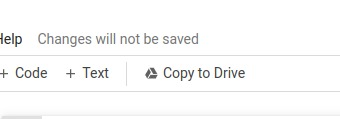

To ensure you can make changes to the notebook save a copy of it to your own drive and work on that one. You can do that by going to "File" -> "Save a copy in Drive".

**Failing to do so will result in code loss!**

 **Note** Make sure you are the only one that has access to it!


In [ ]:
#@markdown #Image Processing - 67829. { display-mode: "form" }
#@markdown ##Exercise 5:  Deep Style Image Prior
#@markdown ##Seaf Aliyan ID: 211367164

#@title{ display-mode: "form" }

#@markdown
#@markdown This exercise is a bit different than the rest of the exercises in the course.
#@markdown The submissions will be a PDF file with your answers and results to the exercise 
#@markdown as well as some files so that we can verify the authenticity of your results.
#@markdown This notebook provides the basic code, but you do not need to adhere to some specific API 
#@markdown and we will not be running unit tests on your code. 
#@markdown We will however, be going over your code and running it manually. 
#@markdown Moreover, we will be running tests to ensure the authenticity of your solution and detect plagiarism
#@markdown
#@markdown
#@markdown Before you start working on the exercise it is recommended that you review the lecture slides covering neural networks,
#@markdown
#@markdown 
#@markdown **NOTE**: Neural networks are typically trained on GPUs, without GPUs training takes much longer. 
#@markdown To enable GPU tranining click on "Runtime" -> "Change runtime type" -> "GPU" -> "SAVE".
#@markdown
#@markdown **NOTE**: A short guide on debugging your code using colab is availble [here](https://colab.research.google.com/github/jakevdp/PythonDataScienceHandbook/blob/master/notebooks/01.06-Errors-and-Debugging.ipynb#scrollTo=qnIn-rWFqoww).

#@markdown But first, we have to download all of the dependencies and install them.
#@markdown Play this cell to download it and get everything ready. markdown This may take a few minutes.

 
!mkdir impr_ex5_resources
%cd impr_ex5_resources
#!wget "https://www.cs.huji.ac.il/~impr/shape_predictor_68_face_landmarks.dat" -O shape_predictor_68_face_landmarks.dat 
#!wget "https://www.cs.huji.ac.il/~impr/align_faces.py" -O align_faces.py 
!wget "https://www.cs.huji.ac.il/~impr/stylegan2-ada-pytorch.tar" -O stylegan2-ada-pytorch.tar
!tar -xvf stylegan2-ada-pytorch.tar
!rm -f stylegan2-ada-pytorch.tar

import sys
ROOT_PATH="/content/impr_ex5_resources/stylegan2-ada-pytorch"
sys.path.append(ROOT_PATH)


!pip install ninja
!pip install mediapy
CHECKPOINTS_PATH = "https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada/pretrained/ffhq.pkl"



import copy
import os
from time import perf_counter
import click
import imageio
import numpy as np
import PIL.Image
import torch
import torch.nn.functional as F

import dnnlib
import legacy
import numpy as np
from skimage.draw import line
from torch.nn.functional import conv2d,conv1d
import mediapy as media
from IPython.display import clear_output


/content/impr_ex5_resources
--2023-02-03 15:46:51--  https://www.cs.huji.ac.il/~impr/stylegan2-ada-pytorch.tar
Resolving www.cs.huji.ac.il (www.cs.huji.ac.il)... 132.65.118.16
Connecting to www.cs.huji.ac.il (www.cs.huji.ac.il)|132.65.118.16|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://www.cs.huji.ac.il/w~impr/stylegan2-ada-pytorch.tar [following]
--2023-02-03 15:46:53--  https://www.cs.huji.ac.il/w~impr/stylegan2-ada-pytorch.tar
Reusing existing connection to www.cs.huji.ac.il:443.
HTTP request sent, awaiting response... 200 OK
Length: 100364800 (96M) [application/x-tar]
Saving to: ‘stylegan2-ada-pytorch.tar’

stylegan2-ada-pytor 100%[===================>]  95.71M  10.9MB/s    in 11s     

2023-02-03 15:47:05 (8.72 MB/s) - ‘stylegan2-ada-pytorch.tar’ saved [100364800/100364800]

stylegan2-ada-pytorch/
stylegan2-ada-pytorch/metrics/
stylegan2-ada-pytorch/._dataset_tool.py
tar: Ignoring unknown extended header keyword 'LIBARCHIVE.xat

# Mounting Google Drive

In [ ]:
#@markdown **NOTE**: It is strongly advised you save your results to Google 
#@markdown Drive as they will be deleted from Colab once it restarts. 
#@markdown To connect Google Drive run this cell. 
from google.colab import drive
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


Below is the root dir of your Google Drive. To choose the destenation of the dir to save and read from, create it in your Google Drive and add the relative path to the "GDRIVE_SAVE_REL_PATH" variable below.

In [ ]:
ROOT_GDRIVE_PATH="/content/gdrive/MyDrive/"
GDRIVE_SAVE_REL_PATH = "impr-ex5-files/"
FULL_GDRIVE_SAVE_PATH = ROOT_GDRIVE_PATH + GDRIVE_SAVE_REL_PATH

# General Variables

In [ ]:
GAUSSIAN_BLUR_DEGRADATION= 'GAUSSIAN_BLUR_DEGRADATION'
GRAYSCALE_DEGRADATION = 'GRAYSCALE_DEGRADATION'
INPAINTING_DEGRADATION = 'INPAINTING_DEGRADATION'
NO_DEGRADATION= 'NO_DEGRADATION'
SAME = 'same'
CUDA = 'cuda'

# General Helpers

In [ ]:
import matplotlib.pyplot as plt
plt.style.use('ggplot')
def plot_a_plot(x_vals, y_vals, x_label, y_label, title, labels):
  plt.rc('axes', titlesize=18)     # fontsize of the axes title
  plt.rc('axes', labelsize=14)    # fontsize of the x and y labels
  plt.rc('xtick', labelsize=13)    # fontsize of the tick labels
  plt.rc('ytick', labelsize=13)    # fontsize of the tick labels
  plt.rc('legend', fontsize=13)    # legend fontsize
  plt.rc('font', size=13)          # controls default text sizes
  plt.figure(figsize=(16,9), tight_layout=True)
  plt.plot(x_vals, y_vals) # x,y
  plt.xlabel(x_label)
  plt.ylabel(y_label)
  plt.title(title)
  plt.legend(title_fontsize = 13, labels=labels)
  plt.show()

# 3.1 Image Alignment

In [ ]:
def align_any_image(img_in, img_out):
  os.system(f"python {ROOT_PATH}/align_faces/align_faces.py {img_in} {img_out} {ROOT_PATH}/align_faces/shape_predictor_68_face_landmarks.dat")

In [ ]:
# The align_faces.py script takes in an input image path, an output image path, and a dat file path. The dat file is already downloaded for you, so leave it as it is. 
# It is advised that you save the files to google drive as restarting Colab will erase them.
!python "$ROOT_PATH/align_faces/align_faces.py" '/content/gdrive/MyDrive/impr-ex5-files/image_alignment/img1.png' '/content/gdrive/MyDrive/impr-ex5-files/image_alignment/img1_out.png' "$ROOT_PATH/align_faces/shape_predictor_68_face_landmarks.dat"

Number of faces detected: 1
Detection 0: Left: 340 Top: 167 Right: 563 Bottom: 390
Part 0: (353, 222), Part 1: (350, 247) ...


# 3.2 GAN Inversion

## Degradation Functions 

In [ ]:
    # ********************************************************************************************************
    # ******************                   DEGRADATION FUNCTIONS BELOW                      ******************
    # ********************************************************************************************************

### Setup & Helpers:

In [ ]:
from scipy.signal import convolve
from torch.nn.functional import conv2d
from PIL import Image

In [ ]:
def oneD_filter(filter_size):
    """
    1D Gaussian filter.
    """
    if filter_size == 1:
        return np.array([1])
    else:
        filter_vec = np.array([0.5, 0.5])
        vec = np.array([0.5, 0.5])
        for i in range(2, filter_size):
            filter_vec = convolve(filter_vec, vec)
    return filter_vec

### Blur:

In [ ]:
def blur(target, filter_size):
    filter_vec = oneD_filter(filter_size).reshape(1, filter_size)
    torched_filter = torch.tensor(filter_vec, device=torch.device(CUDA), dtype=torch.float32)

    torched_filter_reg = torched_filter.reshape(1,1,filter_size,1).repeat(3, 1, 1, 1)
    torched_filter_trans = torched_filter.reshape(1,1,1,filter_size).repeat(3, 1, 1, 1)

    blur_x = conv2d(target.to(torch.float32), torched_filter_reg, padding=SAME, groups=3)
    blur_xy = conv2d(blur_x, torched_filter_trans, padding=SAME, groups=3)

    return blur_xy

### InPaint:

In [ ]:
def inpaint(target, mask):
  return target * mask

### Colorize:

In [ ]:
def colorize(target, device):
    grayed = 0.299*target[0][0]+ 0.587*target[0][1]+ 0.114*target[0][2]
    img_grayed = torch.stack([grayed, grayed,grayed]).to(device).unsqueeze(0)
    return img_grayed

## Run & Inversion Code

In [ ]:
def run_latent_optimization(outdir,
    degradation_mode,
    G,
    imgs_to_disply_dict,
    loss_record,
    target: torch.Tensor, # [C,H,W] and dynamic range [0,255], W & H must match G output resolution
    *,
    blur_kernerl_size=-1,
    num_steps                  = 1000,
    w_avg_samples              = 10000,
    initial_learning_rate      = 0.1,
    initial_noise_factor       = 0.05,
    lr_rampdown_length         = 0.25,
    lr_rampup_length           = 0.05,
    noise_ramp_length          = 0.75,
    regularize_noise_weight    = 1e5,
    latent_dist_reg_weight     = 0.001,
    device: torch.device,
    mask                       = None,
):
    assert target.shape == (G.img_channels, G.img_resolution, G.img_resolution)

    G = copy.deepcopy(G).eval().requires_grad_(False).to(device) # type: ignore
  
    # Compute w stats.
    print(f'Computing W midpoint and stddev using {w_avg_samples} samples...')
    z_samples = np.random.RandomState(123).randn(w_avg_samples, G.z_dim)
    w_samples = G.mapping(torch.from_numpy(z_samples).to(device), None)  # [N, L, C]
    w_samples = w_samples.cpu().numpy().astype(np.float32)
    w_avg = np.mean(w_samples, axis=0, keepdims=True)      # [1, 18, C]
    w_avg_original = torch.from_numpy(w_avg).to(device).float()
    w_std = (np.sum((w_samples - w_avg) ** 2) / w_avg_samples) ** 0.5

    # Setup noise inputs.
    noise_bufs = { name: buf for (name, buf) in G.synthesis.named_buffers() if 'noise_const' in name }

    # Load VGG16 feature detector.
    url = 'https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/metrics/vgg16.pt'
    with dnnlib.util.open_url(url) as f:
        vgg16 = torch.jit.load(f).eval().to(device)
    
    # Features for target image.
    target_images = target.unsqueeze(0).to(device).to(torch.float32)

    if target_images.shape[2] > 256:
        target_images = F.interpolate(target_images, size=(256, 256), mode='area')
    target_features = vgg16(target_images, resize_images=False, return_lpips=True)

    w_opt = torch.tensor(w_avg, dtype=torch.float32, device=device, requires_grad=True) 
    w_out = torch.zeros([num_steps] + list(w_opt.shape[1:]), dtype=torch.float32, device=device)
    optimizer = torch.optim.Adam([w_opt] + list(noise_bufs.values()), betas=(0.9, 0.999), lr=initial_learning_rate)
    
    # Init noise.
    for buf in noise_bufs.values():
        buf[:] = torch.randn_like(buf)
        buf.requires_grad = True

    for step in range(num_steps):
        # Learning rate schedule.
        t = step / num_steps
        w_noise_scale = w_std * initial_noise_factor * max(0.0, 1.0 - t / noise_ramp_length) ** 2
        lr_ramp = min(1.0, (1.0 - t) / lr_rampdown_length)
        lr_ramp = 0.5 - 0.5 * np.cos(lr_ramp * np.pi)
        lr_ramp = lr_ramp * min(1.0, t / lr_rampup_length)
        lr = initial_learning_rate * lr_ramp
        for param_group in optimizer.param_groups:
            param_group['lr'] = lr

        # Synth image from opt_w
        w_noise = torch.randn_like(w_opt) * w_noise_scale
        ws = w_opt + w_noise
        synth_images = G.synthesis(ws, noise_mode='const')
        
        # Prep to save synth image
        synth_image_save = (synth_images + 1) * (255/2)
        synth_image_save = synth_image_save.permute(0, 2, 3, 1).clamp(0, 255).to(torch.uint8)[0].cpu().numpy()
    
    
        # ********************************************************************************************************
        # ******************                   NEED TO FILL IN THE FOLLOWING CODE               ******************
        # ********************************************************************************************************
        if  degradation_mode == INPAINTING_DEGRADATION:
          synth_image_degraded_save = (synth_images + 1) * (255/2)
          synth_image_degraded_save = inpaint(synth_image_degraded_save, mask)

        elif degradation_mode == GRAYSCALE_DEGRADATION:
          synth_images = colorize(synth_images, device)
          synth_image_degraded_save = (synth_images + 1) * (255/2)
        elif degradation_mode == GAUSSIAN_BLUR_DEGRADATION:
          synth_images = blur(synth_images, blur_kernerl_size)
          synth_image_degraded_save = (synth_images + 1) * (255/2)
        else:
            synth_image_degraded_save = (synth_images + 1) * (255/2)
  
        # ********************************************************************************************************
        # ******************                          END CODE TO ADD SECTION                   ******************
        # ********************************************************************************************************
         
        
        # Prep to save and show images
        synth_image_degraded_save = synth_image_degraded_save.permute(0, 2, 3, 1).clamp(0, 255).to(torch.uint8)[0].cpu().numpy()  
        
        if step % 20 == 0:
          imgs_to_disply_dict["Generated Image"]=synth_image_save
          imgs_to_disply_dict["Generated Degraded Image"]=synth_image_degraded_save
          clear_output(wait=True)
          media.show_images(imgs_to_disply_dict,height=256)
        if step % 100 == 0:
          PIL.Image.fromarray(synth_image_save, 'RGB').save(f'{outdir}/intermidiate_%d_not_degraded.png'%step)
          PIL.Image.fromarray(synth_image_degraded_save, 'RGB').save(f'{outdir}/intermidiate_%d_degraded.png'%step)


        # Noise regularization.
        reg_loss = 0.0
        for v in noise_bufs.values():
            noise = v[None,None,:,:] # must be [1,1,H,W] for F.avg_pool2d()
            while True:
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=3)).mean()**2
                reg_loss += (noise*torch.roll(noise, shifts=1, dims=2)).mean()**2
                if noise.shape[2] <= 8:
                    break
                noise = F.avg_pool2d(noise, kernel_size=2)

        # Downsample image to 256x256 if it's larger than that. VGG was built for 224x224 images.
        synth_images = (synth_images + 1) * (255/2)
        if degradation_mode == INPAINTING_DEGRADATION:
          synth_images = inpaint(synth_images, mask)
        if synth_images.shape[2] > 256:
            synth_images = F.interpolate(synth_images, size=(256, 256), mode='area')

        # Features for synth images.
        synth_features = vgg16(synth_images, resize_images=False, return_lpips=True)
        
        # Compute loss
        percep_loss = (target_features - synth_features).square().sum()
        latent_dist_reg = F.l1_loss(w_avg_original, w_opt)
        loss = percep_loss + reg_loss * regularize_noise_weight  + latent_dist_reg_weight * latent_dist_reg


        # Step
        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()

        print(f'step {step+1:>4d}/{num_steps}: percep_loss {percep_loss:<4.2f} latent_dist_reg {latent_dist_reg:<4.2f} loss {float(loss):<5.2f}' )
        loss_record.append(loss)
        # Save inverted latent for each optimization step.
        w_out[step] = w_opt.detach()[0]

        # Normalize noise.
        with torch.no_grad():
            for buf in noise_bufs.values():
                buf -= buf.mean()
                buf *= buf.square().mean().rsqrt()
    return w_out

In [ ]:
def invert_image(degradation_mode,
                   target_fname,
                   outdir,
                  loss_record,
                  blur_kernerl_size=-1,
                  seed=303,
                  num_steps=1000,
                  latent_dist_reg_weight=0.5,
                  mask=None,
                    ):
    np.random.seed(seed)
    torch.manual_seed(seed)

    # Load networks.
    print('Loading networks from "%s"...' % CHECKPOINTS_PATH)
    device = torch.device(CUDA)
    with dnnlib.util.open_url(CHECKPOINTS_PATH) as fp:
        networks = legacy.load_network_pkl(fp)
        G = networks['G_ema'].requires_grad_(False).to(device)
        

    # Load target image.
    if not os.path.exists(outdir):
      os.makedirs(outdir)
    target_pil = PIL.Image.open(target_fname).convert('RGB')
    w, h = target_pil.size
    s = min(w, h)
    target_pil = target_pil.crop(((w - s) // 2, (h - s) // 2, (w + s) // 2, (h + s) // 2))
    target_pil = target_pil.resize((G.img_resolution, G.img_resolution), PIL.Image.LANCZOS)
    target_uint8 = np.array(target_pil, dtype=np.uint8)
    # target=torch.tensor(target_uint8.transpose([2, 0, 1]), device=device)
    target = torch.tensor([target_uint8.transpose([2, 0, 1])], device=device)
    target_images = target[0].unsqueeze(0).to(device).to(torch.float32)

    mask_target = None if mask is None else setup_mask(mask, device, G)

    # ********************************************************************************************************
    # ******************                   NEED TO FILL IN THE FOLLOWING CODE               ******************
    # ********************************************************************************************************
    if  degradation_mode == INPAINTING_DEGRADATION:
      target = inpaint(target, mask_target)      
    elif degradation_mode == GRAYSCALE_DEGRADATION:
      target = colorize(target, device)
    elif degradation_mode == GAUSSIAN_BLUR_DEGRADATION:
      target = blur(target, blur_kernerl_size)
    # ********************************************************************************************************
    # ******************                          END CODE TO ADD SECTION                   ******************
    # ********************************************************************************************************

    #Save target image
    target_to_save = target.permute(0, 2, 3, 1).clamp(0, 255).to(torch.uint8)[0].cpu().numpy()
    PIL.Image.fromarray(target_to_save, 'RGB').save(f'{outdir}/original_degraded_image.png')
    imgs_to_disply_dict = {
        "Original Image":target_uint8,
        "Original Degraded Image":target_to_save,
              }

    # Run latent optimization
    start_time = perf_counter()
    optimization_steps = run_latent_optimization(
        outdir,
        degradation_mode,
        G,
        imgs_to_disply_dict,
        loss_record,
        target[0],
        blur_kernerl_size=blur_kernerl_size,
        num_steps=num_steps,
        device=device,
        latent_dist_reg_weight=latent_dist_reg_weight,
        mask=mask_target,   
    )

    print (f'Elapsed: {(perf_counter()-start_time):.1f} s')
    loss_as_float = [float(x) for x in loss_record]
    blur_size = f'Kernel Size {str(blur_kernerl_size)}' if blur_kernerl_size != -1 else ''
    plot_a_plot(range(len(loss_as_float)),loss_as_float, "Steps", "Loss", f"Optimization Loss Over Steps - {latent_dist_reg_weight}", [f"Loss - {degradation_mode} {blur_size}"])
    os.makedirs(outdir, exist_ok=True)

    # Save final inverted image and latent vector.
    inverted_latent = optimization_steps[-1]
    synth_image = G.synthesis(inverted_latent.unsqueeze(0), noise_mode='const')
    synth_image = (synth_image + 1) * (255/2)
    synth_image = synth_image.permute(0, 2, 3, 1).clamp(0, 255).to(torch.uint8)[0].cpu().numpy()
    PIL.Image.fromarray(synth_image, 'RGB').save(f'{outdir}/final_inverted_image.png')
    np.savez(f'{outdir}/inverted_latent.npz', latent=inverted_latent.unsqueeze(0).cpu().numpy())

## GAN Inversion Task

### Setup variables, file names, and align image:


In [ ]:
degradation_mode = "none"
gan_inversion_dir = FULL_GDRIVE_SAVE_PATH + "/gan_inversion/"
original_image_path = gan_inversion_dir + "img1.png"
target_fname = gan_inversion_dir + 'img1_out.png'
outdir = gan_inversion_dir + "out/"

align_any_image(
    original_image_path,
target_fname
)

### Run GAN-Inversion:

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

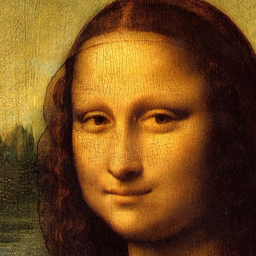
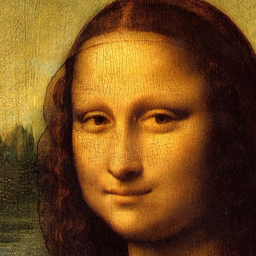
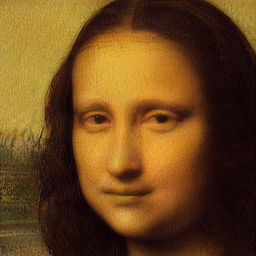
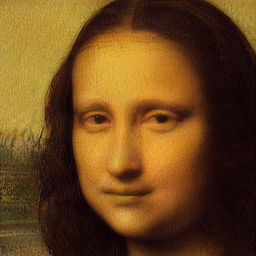

step  741/750: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  742/750: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  743/750: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  744/750: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  745/750: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  746/750: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  747/750: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  748/750: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  749/750: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  750/750: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
Elapsed: 196.3 s


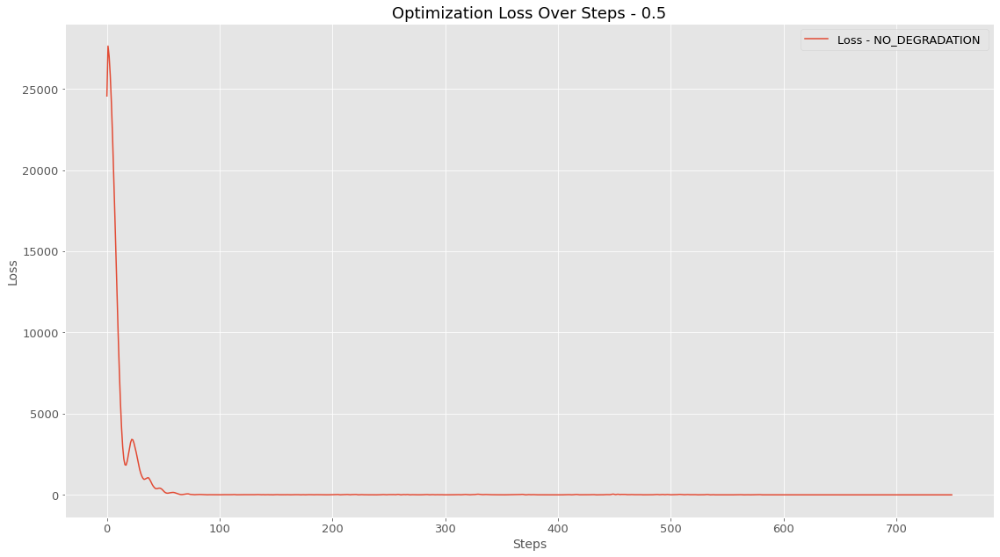

In [ ]:
loss_record = []
invert_image(NO_DEGRADATION,
                  target_fname,
                  outdir,
                  loss_record,
                  num_steps=750,
                  latent_dist_reg_weight=0.5)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

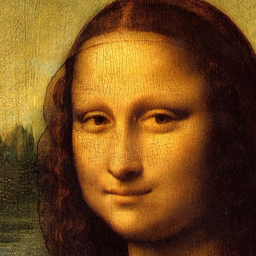
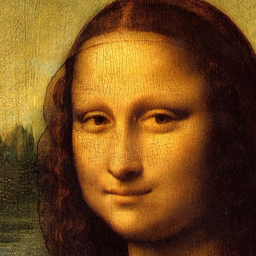
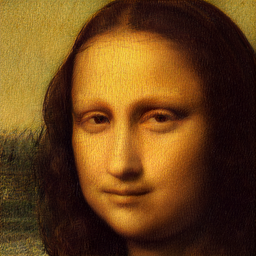
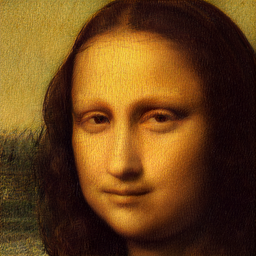

step  741/750: percep_loss 0.16 latent_dist_reg 0.18 loss 0.21 
step  742/750: percep_loss 0.16 latent_dist_reg 0.18 loss 0.21 
step  743/750: percep_loss 0.16 latent_dist_reg 0.18 loss 0.21 
step  744/750: percep_loss 0.16 latent_dist_reg 0.18 loss 0.21 
step  745/750: percep_loss 0.16 latent_dist_reg 0.18 loss 0.21 
step  746/750: percep_loss 0.16 latent_dist_reg 0.18 loss 0.21 
step  747/750: percep_loss 0.16 latent_dist_reg 0.18 loss 0.21 
step  748/750: percep_loss 0.16 latent_dist_reg 0.18 loss 0.21 
step  749/750: percep_loss 0.16 latent_dist_reg 0.18 loss 0.21 
step  750/750: percep_loss 0.16 latent_dist_reg 0.18 loss 0.21 
Elapsed: 199.9 s


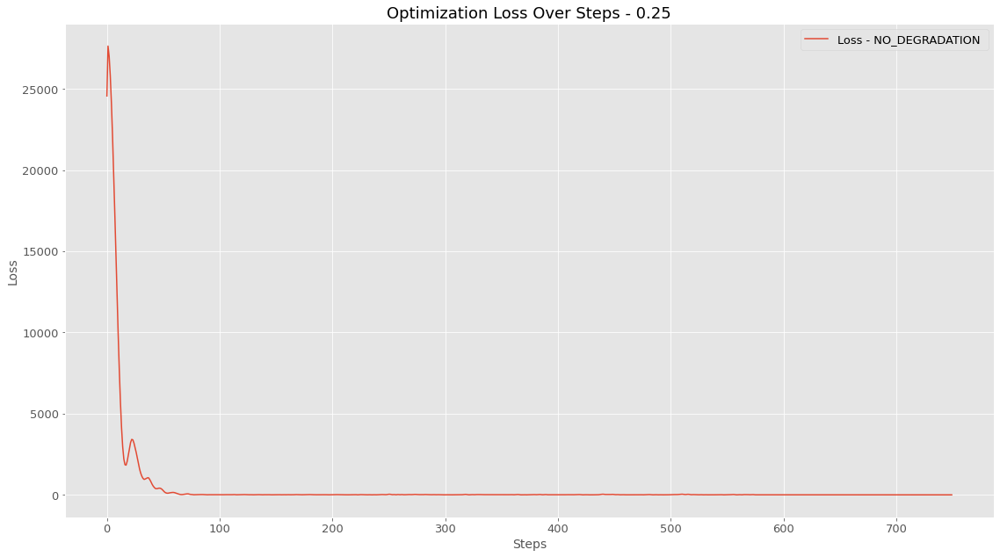

In [ ]:
loss_record = []
invert_image(NO_DEGRADATION,
                  target_fname,
                  outdir+'0/',
                  loss_record,
                  num_steps=750,
                  latent_dist_reg_weight=0.25)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

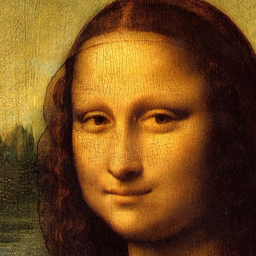
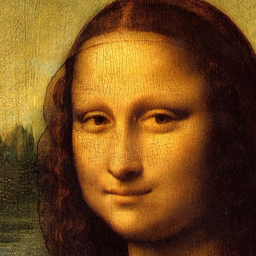
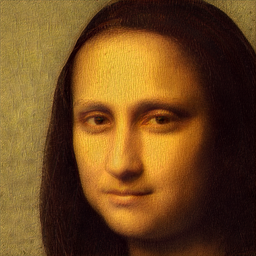
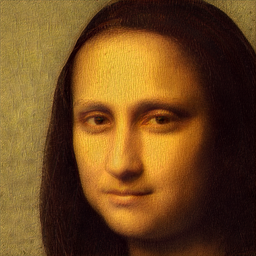

step  181/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.67 
step  182/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.36 
step  183/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.40 
step  184/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.51 
step  185/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.32 
step  186/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.33 
step  187/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.42 
step  188/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.35 
step  189/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.28 
step  190/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.30 
step  191/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.34 
step  192/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.33 
step  193/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.30 
step  194/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.28 
step  195/200: percep_loss 0.22 latent_dist_reg 0.24 loss 0.28 
step  196/200: percep_loss 0.22 latent_d

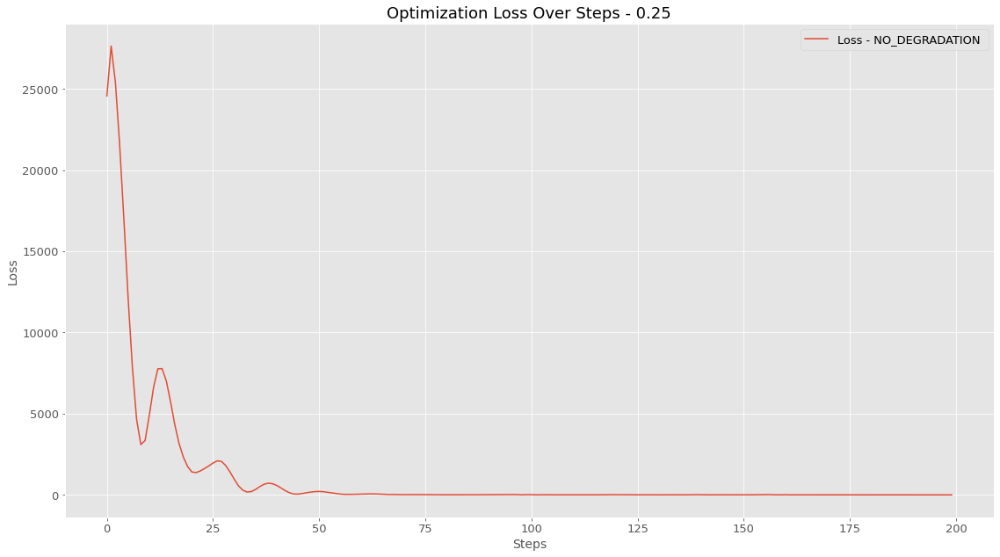

In [ ]:
loss_record = []
invert_image(NO_DEGRADATION,
                  target_fname,
                  outdir+'6/',
                  loss_record,
                  num_steps=200,
                  latent_dist_reg_weight=0.25)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

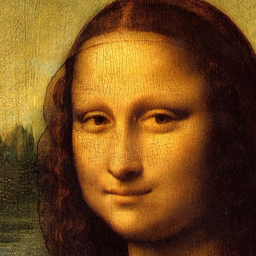
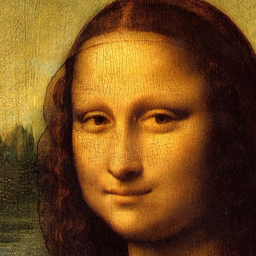
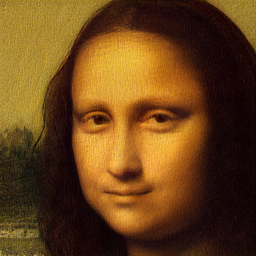
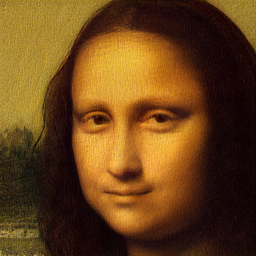

step  741/750: percep_loss 0.16 latent_dist_reg 0.31 loss 0.19 
step  742/750: percep_loss 0.16 latent_dist_reg 0.31 loss 0.19 
step  743/750: percep_loss 0.16 latent_dist_reg 0.31 loss 0.19 
step  744/750: percep_loss 0.16 latent_dist_reg 0.31 loss 0.19 
step  745/750: percep_loss 0.16 latent_dist_reg 0.31 loss 0.19 
step  746/750: percep_loss 0.16 latent_dist_reg 0.31 loss 0.19 
step  747/750: percep_loss 0.16 latent_dist_reg 0.31 loss 0.19 
step  748/750: percep_loss 0.16 latent_dist_reg 0.31 loss 0.19 
step  749/750: percep_loss 0.16 latent_dist_reg 0.31 loss 0.19 
step  750/750: percep_loss 0.16 latent_dist_reg 0.31 loss 0.19 
Elapsed: 197.6 s


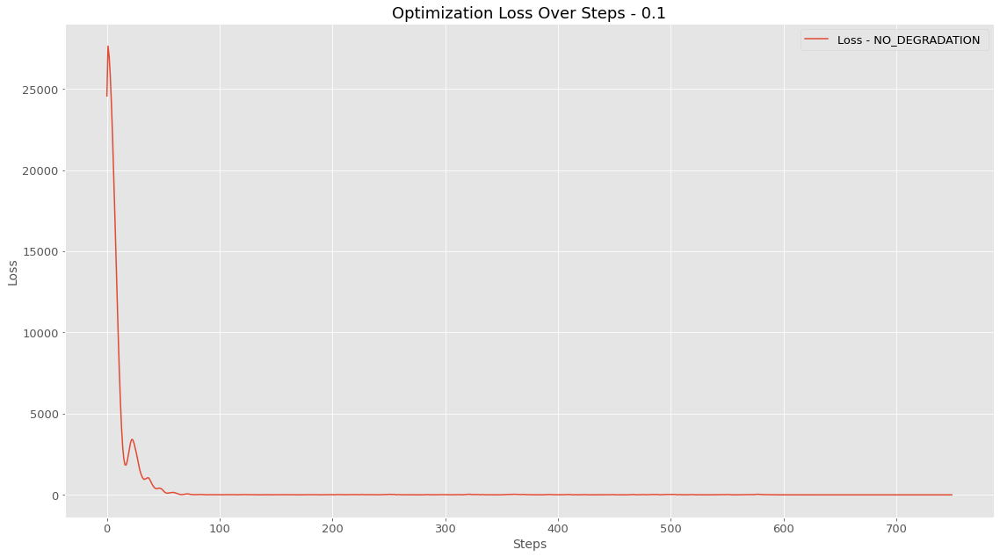

In [ ]:
loss_record = []
invert_image(NO_DEGRADATION,
                  target_fname,
                  outdir+'1/',
                  loss_record,
                  num_steps=750,
                  latent_dist_reg_weight=0.1)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

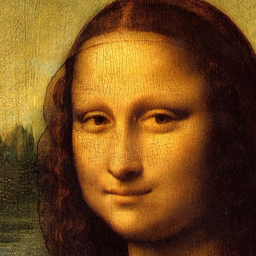
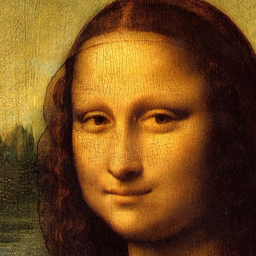
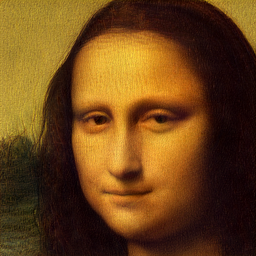
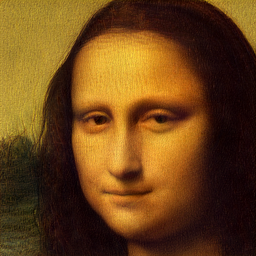

step  741/750: percep_loss 0.16 latent_dist_reg 0.89 loss 0.17 
step  742/750: percep_loss 0.16 latent_dist_reg 0.89 loss 0.17 
step  743/750: percep_loss 0.16 latent_dist_reg 0.89 loss 0.17 
step  744/750: percep_loss 0.16 latent_dist_reg 0.89 loss 0.17 
step  745/750: percep_loss 0.16 latent_dist_reg 0.89 loss 0.17 
step  746/750: percep_loss 0.16 latent_dist_reg 0.89 loss 0.17 
step  747/750: percep_loss 0.16 latent_dist_reg 0.89 loss 0.17 
step  748/750: percep_loss 0.16 latent_dist_reg 0.89 loss 0.17 
step  749/750: percep_loss 0.16 latent_dist_reg 0.89 loss 0.17 
step  750/750: percep_loss 0.16 latent_dist_reg 0.89 loss 0.17 
Elapsed: 197.0 s


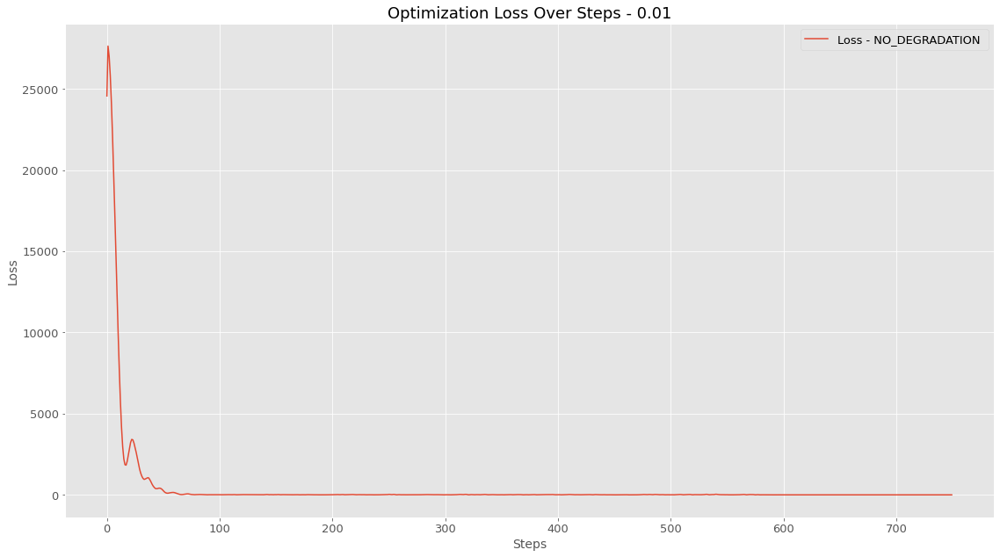

In [ ]:
loss_record = []
invert_image(NO_DEGRADATION,
                  target_fname,
                  outdir+'2/',
                  loss_record,
                  num_steps=750,
                  latent_dist_reg_weight=0.01)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

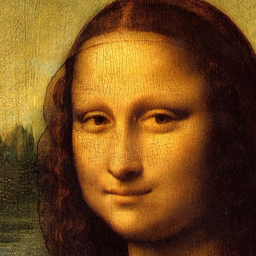
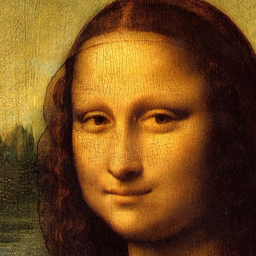
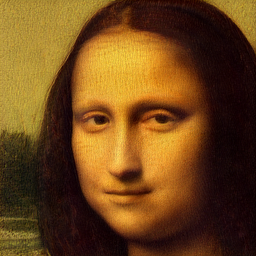
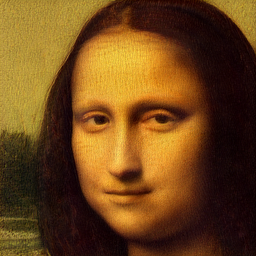

step  741/750: percep_loss 0.16 latent_dist_reg 1.03 loss 0.16 
step  742/750: percep_loss 0.16 latent_dist_reg 1.03 loss 0.16 
step  743/750: percep_loss 0.16 latent_dist_reg 1.03 loss 0.16 
step  744/750: percep_loss 0.16 latent_dist_reg 1.03 loss 0.16 
step  745/750: percep_loss 0.16 latent_dist_reg 1.03 loss 0.16 
step  746/750: percep_loss 0.16 latent_dist_reg 1.03 loss 0.16 
step  747/750: percep_loss 0.16 latent_dist_reg 1.03 loss 0.16 
step  748/750: percep_loss 0.16 latent_dist_reg 1.03 loss 0.16 
step  749/750: percep_loss 0.16 latent_dist_reg 1.03 loss 0.16 
step  750/750: percep_loss 0.16 latent_dist_reg 1.03 loss 0.16 
Elapsed: 197.0 s


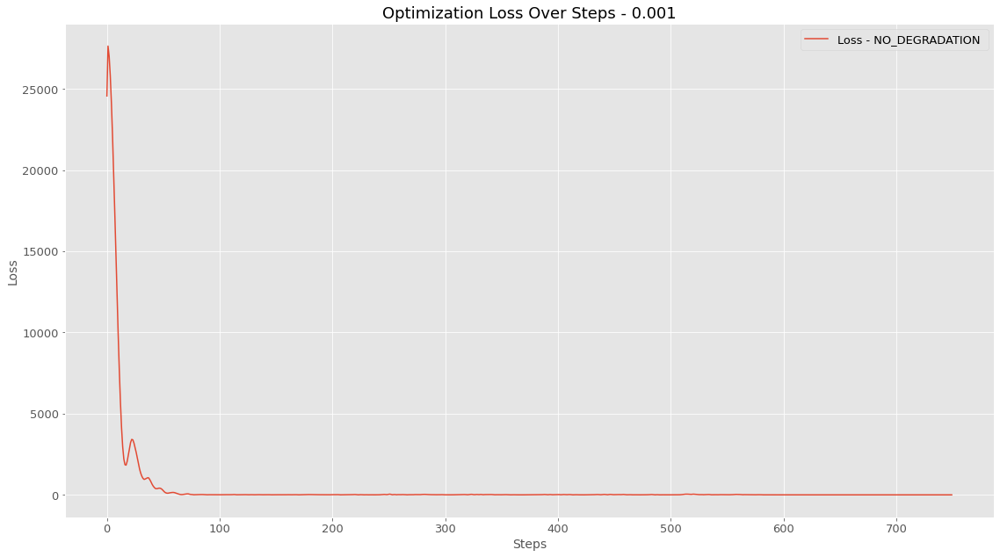

In [ ]:
loss_record = []
invert_image(NO_DEGRADATION,
                  target_fname,
                  outdir+'3/',
                  loss_record,
                  num_steps=750,
                  latent_dist_reg_weight=0.001)

# 3.3 Image Reconstruction Tasks

## 3.1.1 Show De-Blur!


### Setup variables and helpers:

In [ ]:
# Blur setup:
blur_task_dir = FULL_GDRIVE_SAVE_PATH + "/blur_task/"
blur_original_image_path = blur_task_dir + "img1.png"
blur_target_fname = blur_task_dir + 'img1_out.png'
blur_outdir = blur_task_dir + "out/"

align_any_image(
    blur_original_image_path,
    blur_target_fname
)

### Parameters Exploration:

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

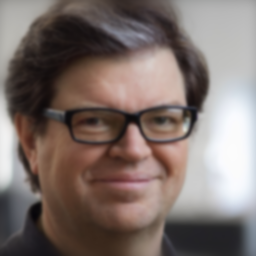
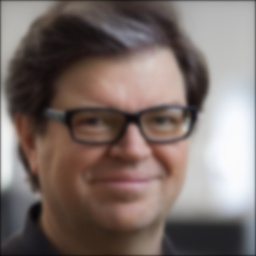
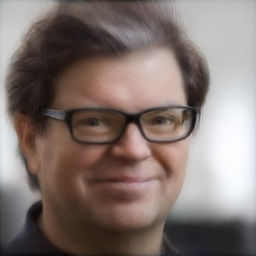
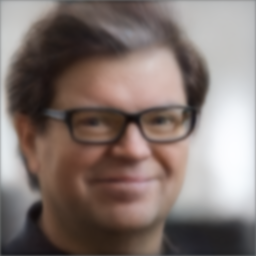

step  781/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  782/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  783/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  784/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  785/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  786/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  787/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  788/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  789/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  790/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  791/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  792/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  793/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  794/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  795/800: percep_loss 0.06 latent_dist_reg 0.20 loss 0.10 
step  796/800: percep_loss 0.06 latent_d

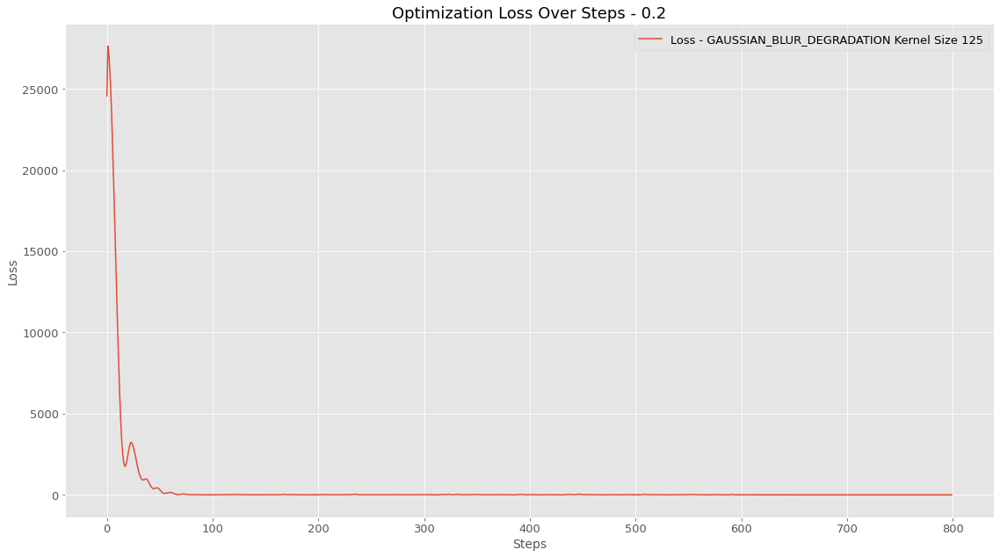

In [ ]:
loss_record = []
blur_kernerl_size = 125
invert_image(GAUSSIAN_BLUR_DEGRADATION,
            blur_target_fname,
            blur_outdir,
            loss_record,
            blur_kernerl_size=blur_kernerl_size,
                   num_steps=800,
                   latent_dist_reg_weight=0.2
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

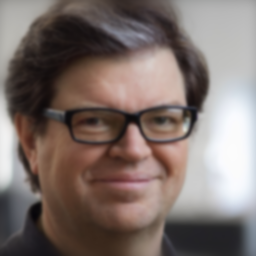
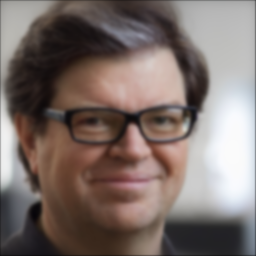
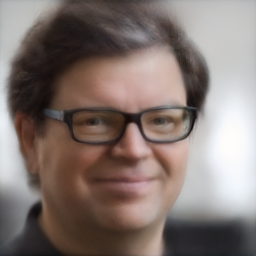
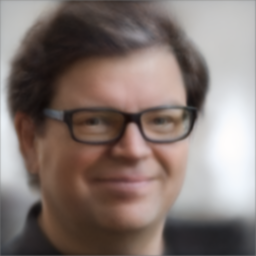

step  481/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  482/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  483/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  484/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  485/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  486/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  487/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  488/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  489/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  490/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  491/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  492/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  493/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  494/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  495/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  496/500: percep_loss 0.08 latent_d

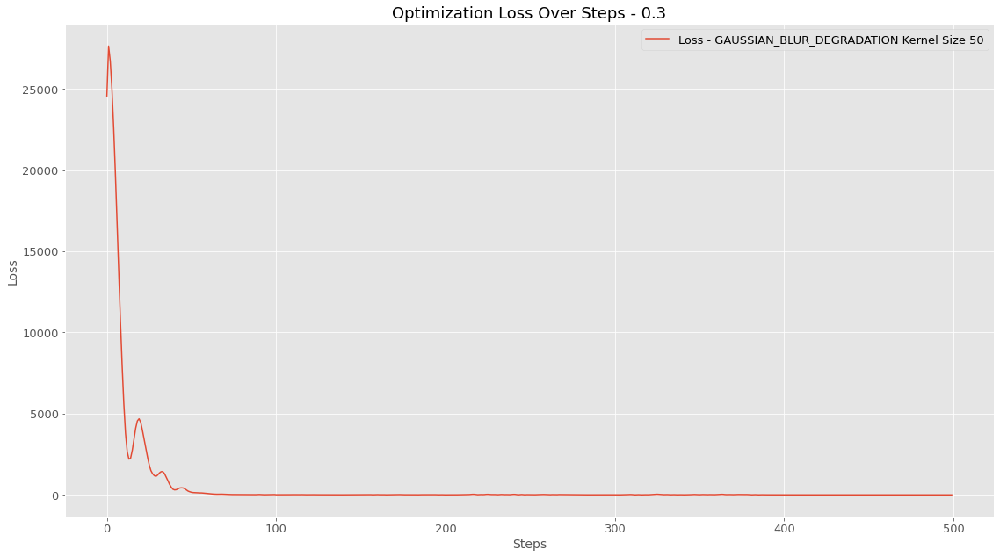

In [ ]:
loss_record = []
blur_kernerl_size = 50
invert_image(GAUSSIAN_BLUR_DEGRADATION,
            blur_target_fname,
            blur_outdir,
            loss_record,
            blur_kernerl_size=blur_kernerl_size,
                   num_steps=500,
                   latent_dist_reg_weight=0.3
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

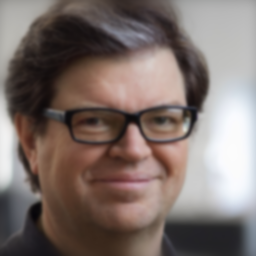
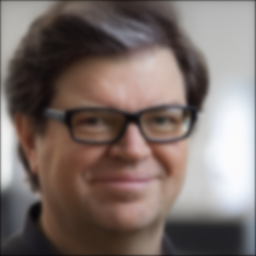
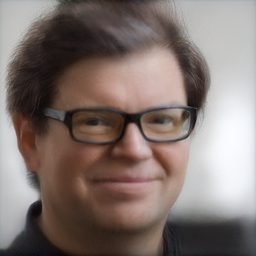
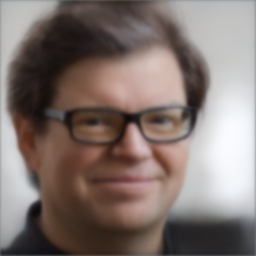

step  481/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  482/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  483/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  484/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  485/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  486/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  487/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  488/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  489/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  490/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  491/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  492/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  493/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  494/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  495/500: percep_loss 0.09 latent_dist_reg 0.15 loss 0.13 
step  496/500: percep_loss 0.09 latent_d

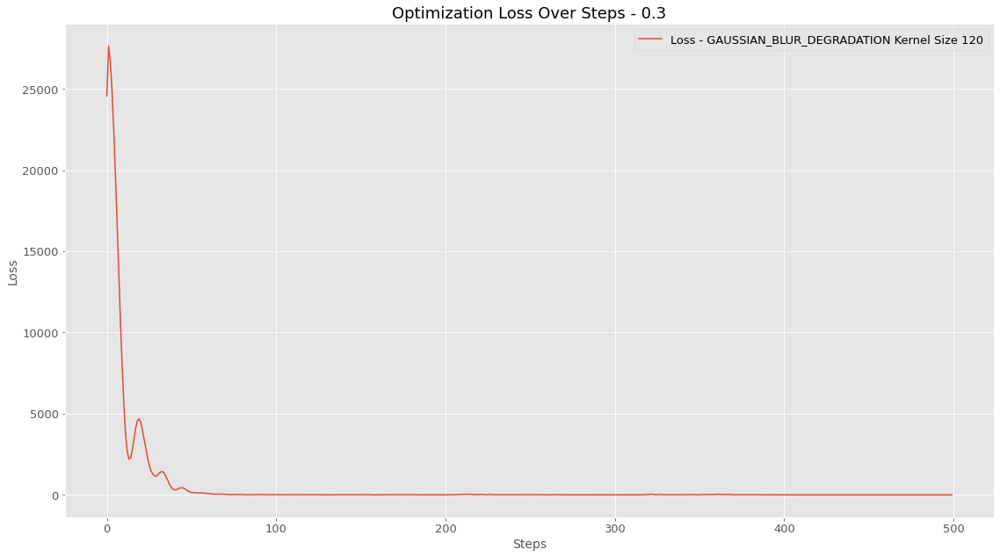

In [ ]:
loss_record = []
blur_kernerl_size = 120
invert_image(GAUSSIAN_BLUR_DEGRADATION,
            blur_target_fname,
            blur_outdir+'1/',
            loss_record,
            blur_kernerl_size=blur_kernerl_size,
                   num_steps=500,
                   latent_dist_reg_weight=0.3
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

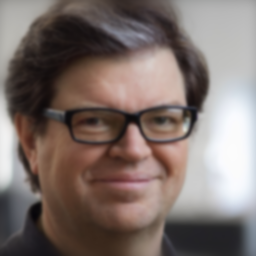
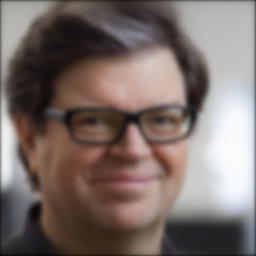
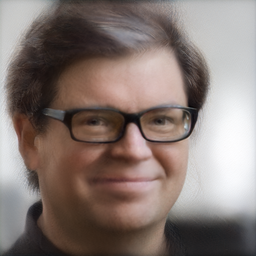
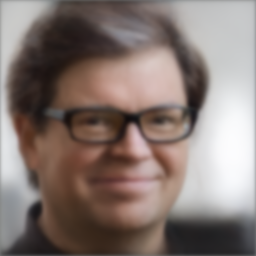

step  481/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  482/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  483/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  484/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  485/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  486/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  487/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  488/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  489/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  490/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  491/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  492/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  493/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  494/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  495/500: percep_loss 0.08 latent_dist_reg 0.15 loss 0.12 
step  496/500: percep_loss 0.08 latent_d

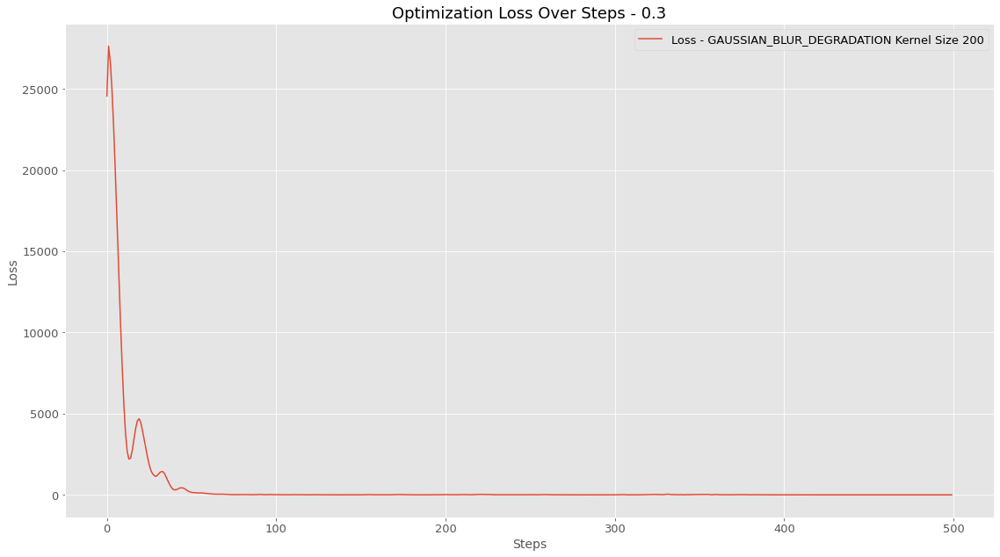

In [ ]:
loss_record = []
blur_kernerl_size = 200
invert_image(GAUSSIAN_BLUR_DEGRADATION,
            blur_target_fname,
            blur_outdir+'2/',
            loss_record,
            blur_kernerl_size=blur_kernerl_size,
                   num_steps=500,
                   latent_dist_reg_weight=0.3
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

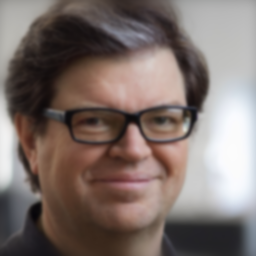
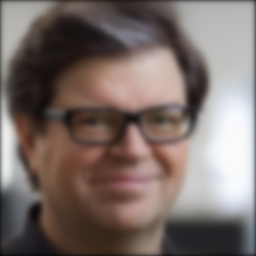
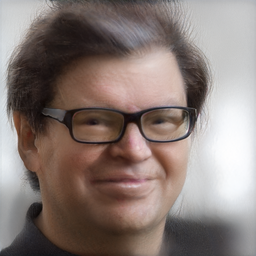
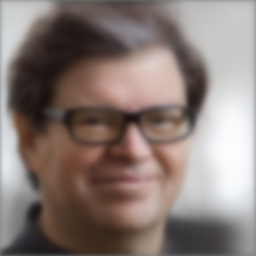

step  481/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  482/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  483/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  484/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  485/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  486/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  487/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  488/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  489/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  490/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  491/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  492/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  493/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  494/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  495/500: percep_loss 0.07 latent_dist_reg 0.16 loss 0.12 
step  496/500: percep_loss 0.07 latent_d

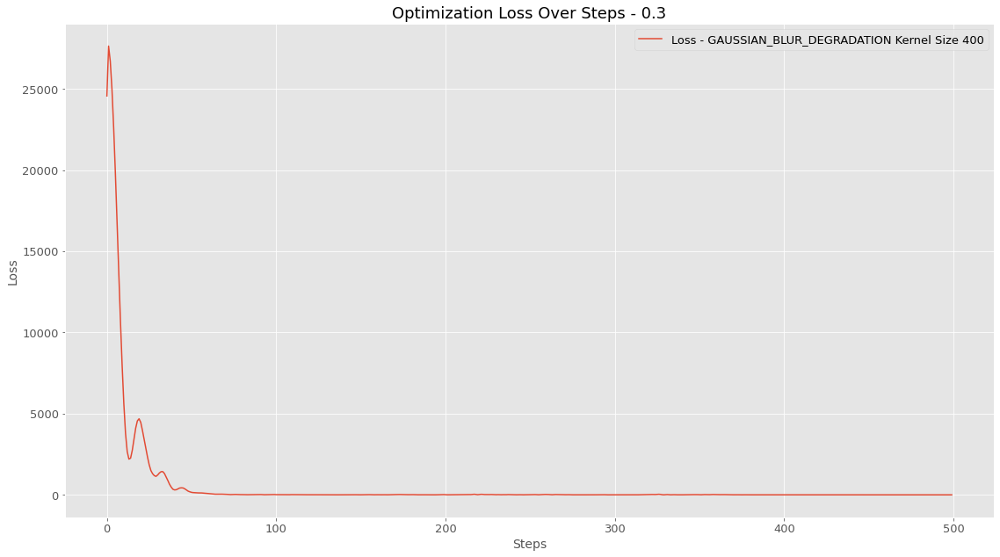

In [ ]:
loss_record = []
blur_kernerl_size = 400
invert_image(GAUSSIAN_BLUR_DEGRADATION,
            blur_target_fname,
            blur_outdir+'3/',
            loss_record,
            blur_kernerl_size=blur_kernerl_size,
                   num_steps=500,
                   latent_dist_reg_weight=0.3
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

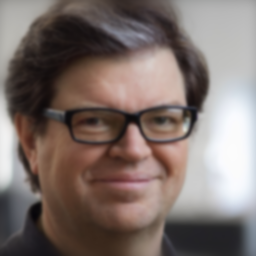
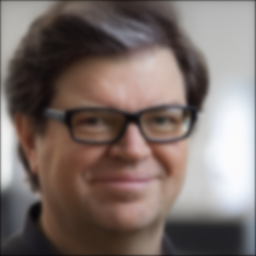
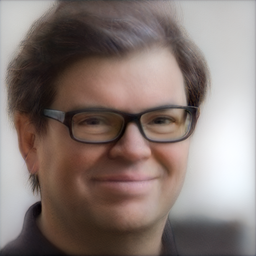
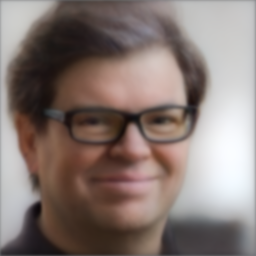

step  481/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  482/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  483/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  484/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  485/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  486/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  487/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  488/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  489/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  490/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  491/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  492/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  493/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  494/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  495/500: percep_loss 0.10 latent_dist_reg 0.86 loss 0.10 
step  496/500: percep_loss 0.10 latent_d

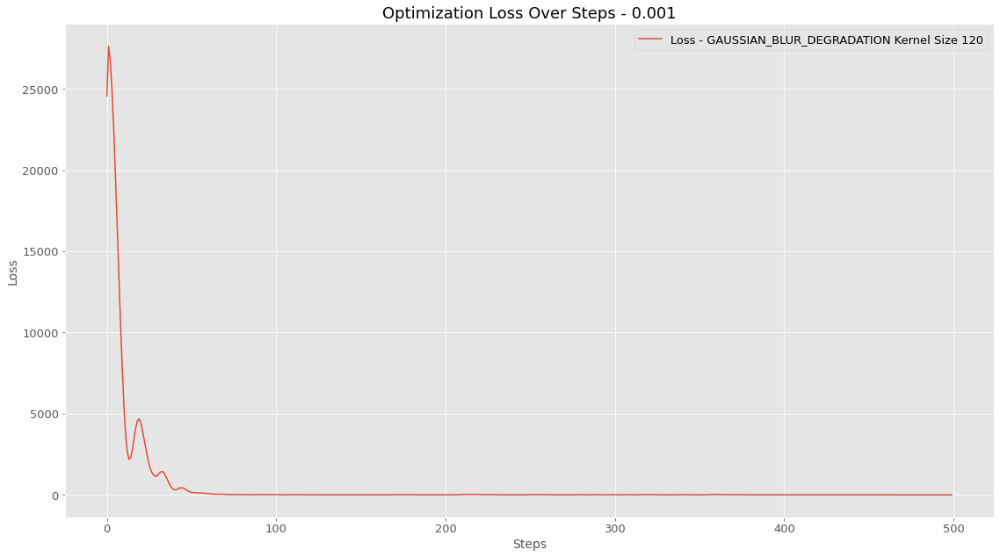

In [ ]:
loss_record = []
blur_kernerl_size = 120
invert_image(GAUSSIAN_BLUR_DEGRADATION,
            blur_target_fname,
            blur_outdir+'5/',
            loss_record,
            blur_kernerl_size=blur_kernerl_size,
                   num_steps=500,
                   latent_dist_reg_weight=0.001
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

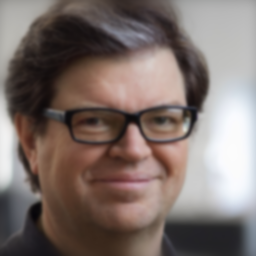
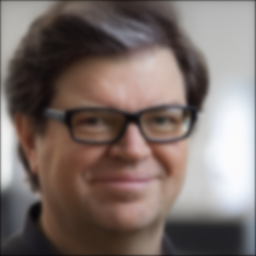
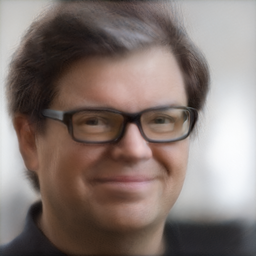
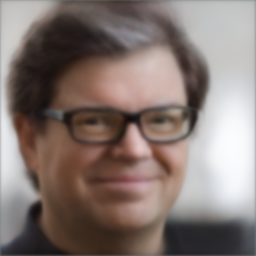

step  981/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  982/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  983/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  984/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  985/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  986/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  987/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  988/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  989/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  990/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  991/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  992/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  993/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  994/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  995/1000: percep_loss 0.07 latent_dist_reg 0.15 loss 0.11 
step  996/1000: percep_lo

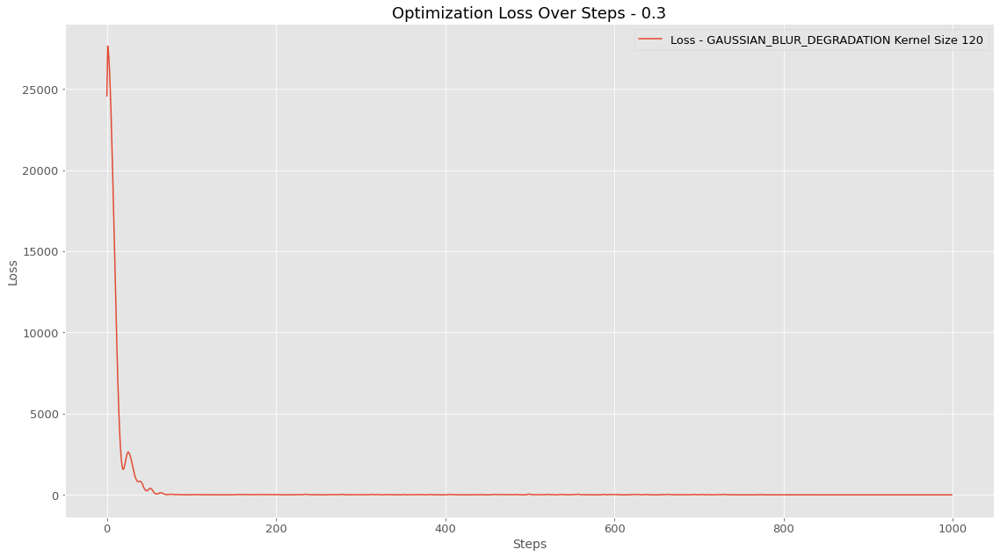

In [ ]:
loss_record = []
blur_kernerl_size = 120
invert_image(GAUSSIAN_BLUR_DEGRADATION,
            blur_target_fname,
            blur_outdir+'1/',
            loss_record,
            blur_kernerl_size=blur_kernerl_size,
                   num_steps=1000,
                   latent_dist_reg_weight=0.3
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

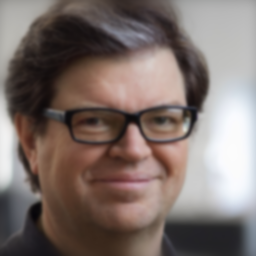
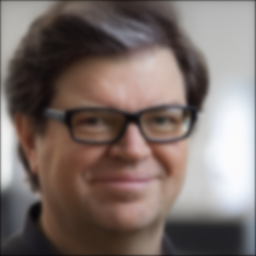
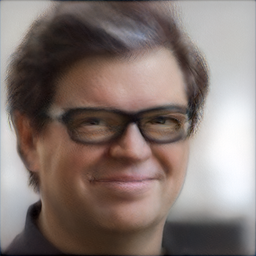
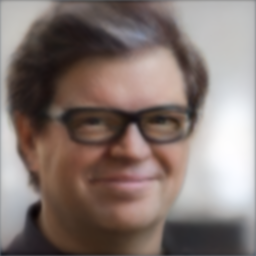

step  981/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  982/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  983/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  984/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  985/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  986/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  987/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  988/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  989/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  990/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  991/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  992/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  993/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  994/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  995/1000: percep_loss 0.06 latent_dist_reg 1.16 loss 0.07 
step  996/1000: percep_lo

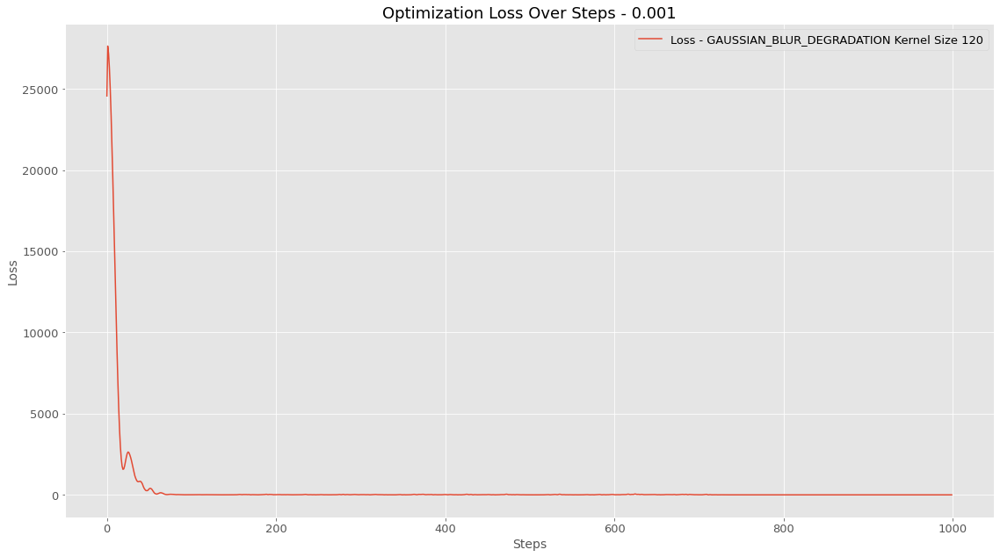

In [ ]:
loss_record = []
blur_kernerl_size = 120
invert_image(GAUSSIAN_BLUR_DEGRADATION,
            blur_target_fname,
            blur_outdir+'1/',
            loss_record,
            blur_kernerl_size=blur_kernerl_size,
                   num_steps=1000,
                   latent_dist_reg_weight=0.001
             )

### Added to PDF:

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

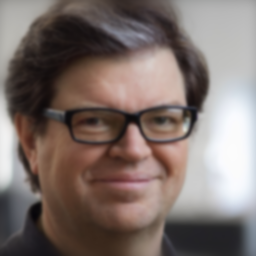
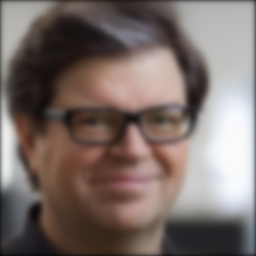
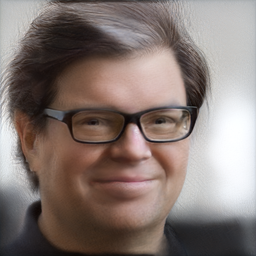
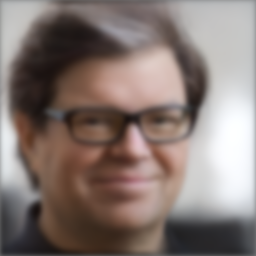

step  981/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  982/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  983/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  984/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  985/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  986/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  987/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  988/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  989/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  990/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  991/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  992/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  993/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  994/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  995/1000: percep_loss 0.06 latent_dist_reg 0.15 loss 0.10 
step  996/1000: percep_lo

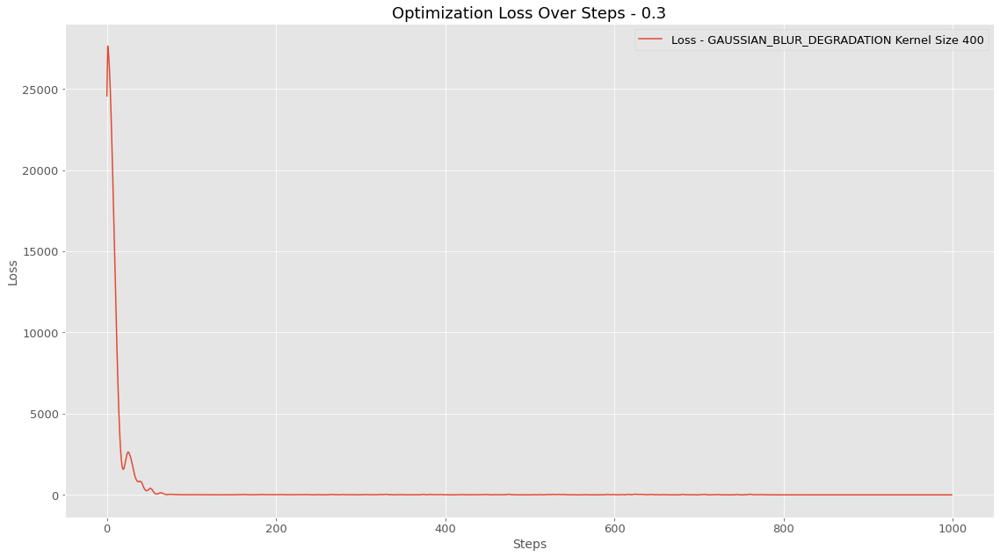

In [ ]:
loss_record = []
blur_kernerl_size = 400
invert_image(GAUSSIAN_BLUR_DEGRADATION,
            blur_target_fname,
            blur_outdir+'4/',
            loss_record,
            blur_kernerl_size=blur_kernerl_size,
                   num_steps=1000,
                   latent_dist_reg_weight=0.3
             )

### My Pic:

In [ ]:
# Blur setup:
blur_task_dir = FULL_GDRIVE_SAVE_PATH + "/blur_task/"
blur_original_image_path = blur_task_dir + "my_img1.png"
blur_target_fname = blur_task_dir + 'img1_out.png'
blur_outdir = blur_task_dir + "my_out/"

align_any_image(
    blur_original_image_path,
    blur_target_fname
)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

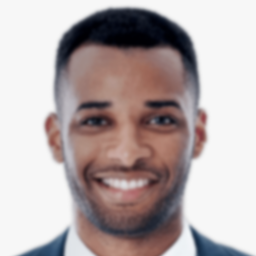
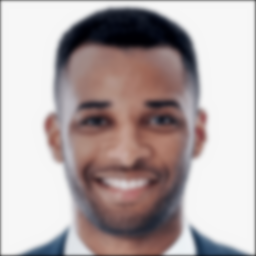
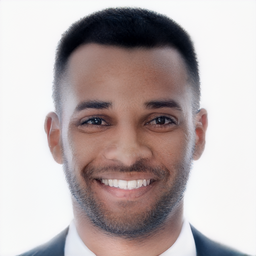
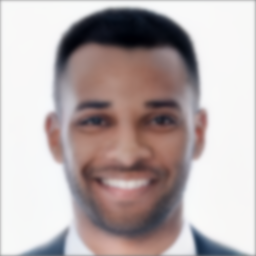

step  981/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  982/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  983/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  984/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  985/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  986/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  987/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  988/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  989/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  990/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  991/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  992/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  993/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  994/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  995/1000: percep_loss 0.03 latent_dist_reg 0.09 loss 0.05 
step  996/1000: percep_lo

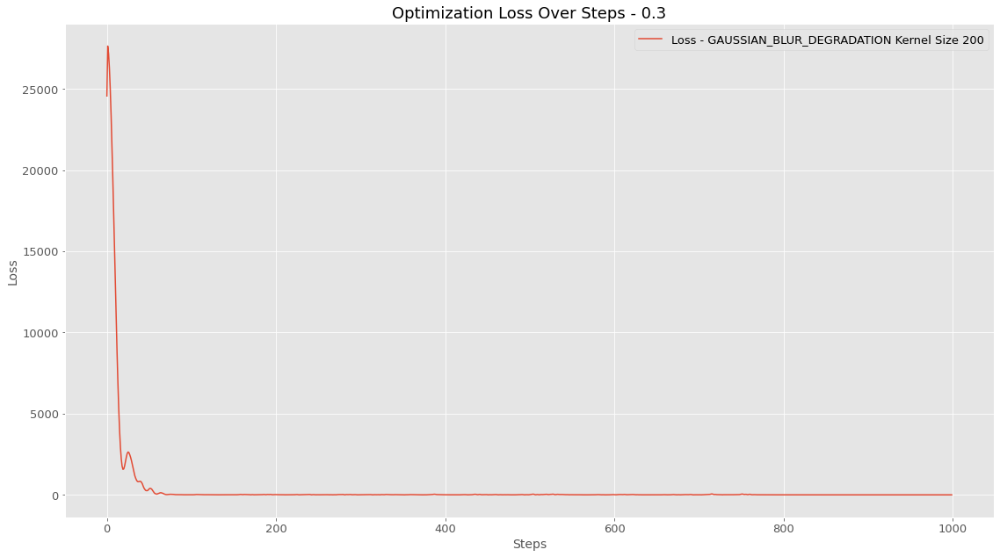

In [ ]:
loss_record = []
blur_kernerl_size = 200
invert_image(GAUSSIAN_BLUR_DEGRADATION,
            blur_target_fname,
            blur_outdir,
            loss_record,
            blur_kernerl_size=blur_kernerl_size,
                   num_steps=1000,
                   latent_dist_reg_weight=0.3
             )

## 3.1.2 Show Colorize!

### Setup variables and helpers:


In [ ]:
# Colorize setup:
colorize_task_dir = FULL_GDRIVE_SAVE_PATH + "/colorize_task/"
colorize_original_image_path = colorize_task_dir + "img1.png"
colorize_target_fname = colorize_task_dir + 'img1_out.png'
colorize_outdir = colorize_task_dir + "out/"

align_any_image(
    colorize_original_image_path,
    colorize_target_fname
)

### Parameters Exploration:

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

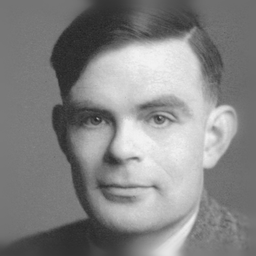
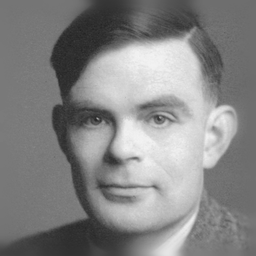
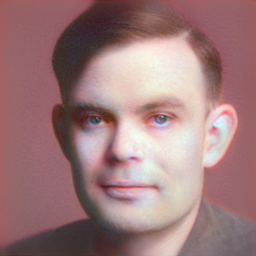
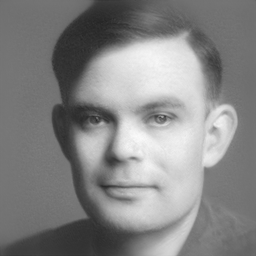

step  281/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  282/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  283/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  284/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  285/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  286/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  287/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  288/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  289/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  290/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  291/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  292/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  293/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  294/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  295/300: percep_loss 0.14 latent_dist_reg 0.71 loss 0.15 
step  296/300: percep_loss 0.14 latent_d

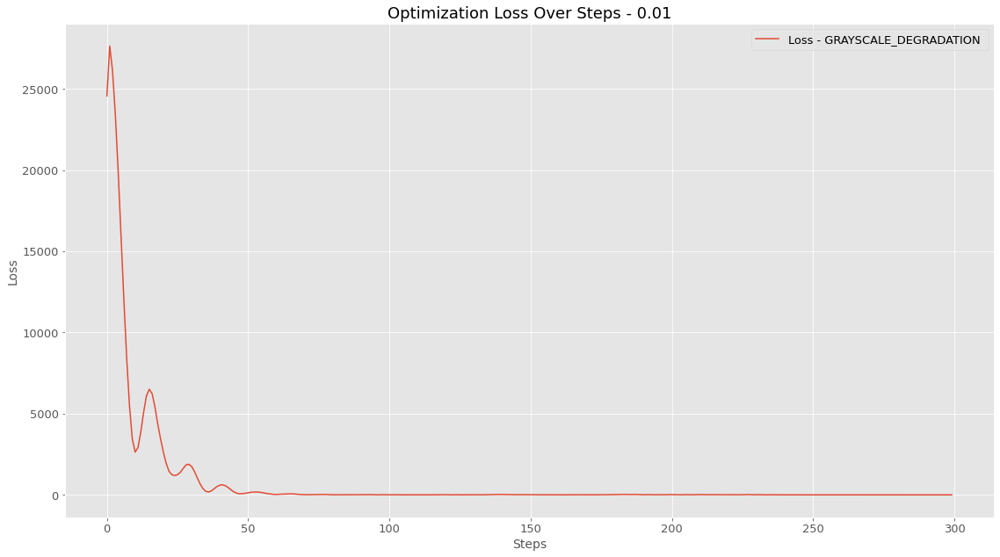

In [ ]:
loss_record = []
invert_image(GRAYSCALE_DEGRADATION,
             colorize_target_fname,
             colorize_outdir+'1/',
            loss_record,
                   num_steps=300,
                   latent_dist_reg_weight=0.01
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

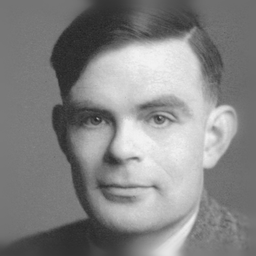
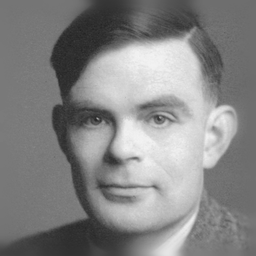
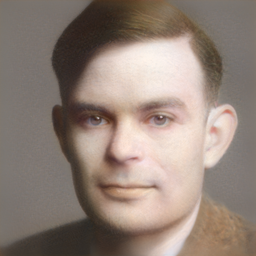
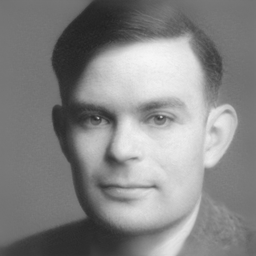

step  281/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.19 
step  282/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  283/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  284/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.19 
step  285/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.19 
step  286/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  287/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  288/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  289/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  290/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  291/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  292/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  293/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  294/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  295/300: percep_loss 0.13 latent_dist_reg 0.19 loss 0.18 
step  296/300: percep_loss 0.13 latent_d

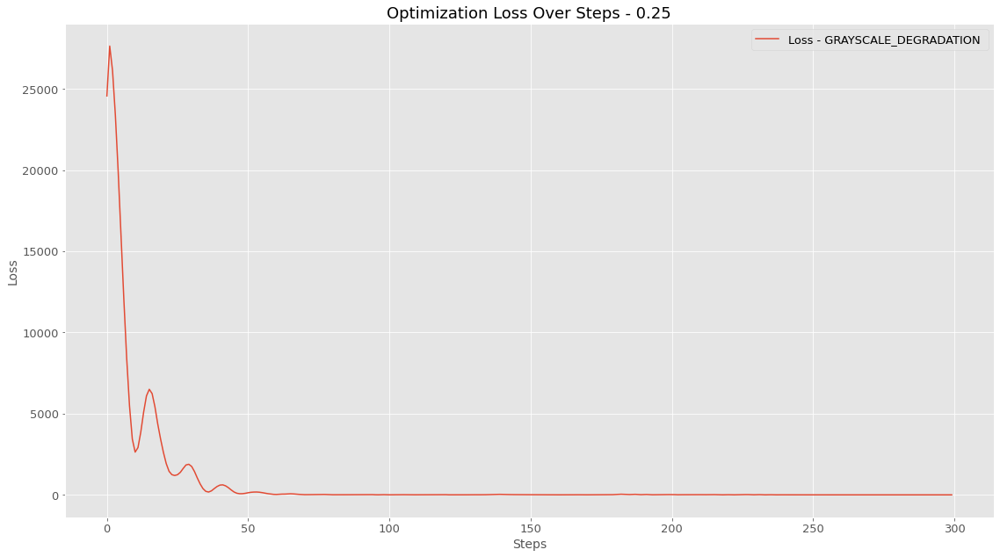

In [ ]:
loss_record = []
invert_image(GRAYSCALE_DEGRADATION,
             colorize_target_fname,
             colorize_outdir+'2/',
            loss_record,
                   num_steps=300,
                   latent_dist_reg_weight=0.25
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

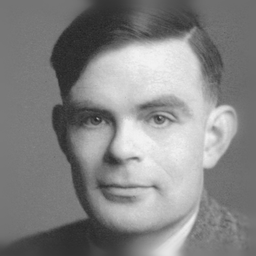
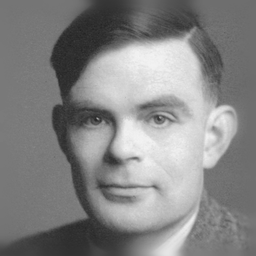
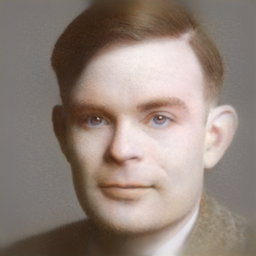
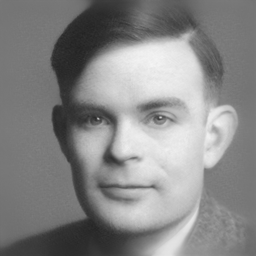

step  981/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  982/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  983/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  984/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  985/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  986/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  987/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  988/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  989/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  990/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  991/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  992/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  993/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  994/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  995/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  996/1000: percep_lo

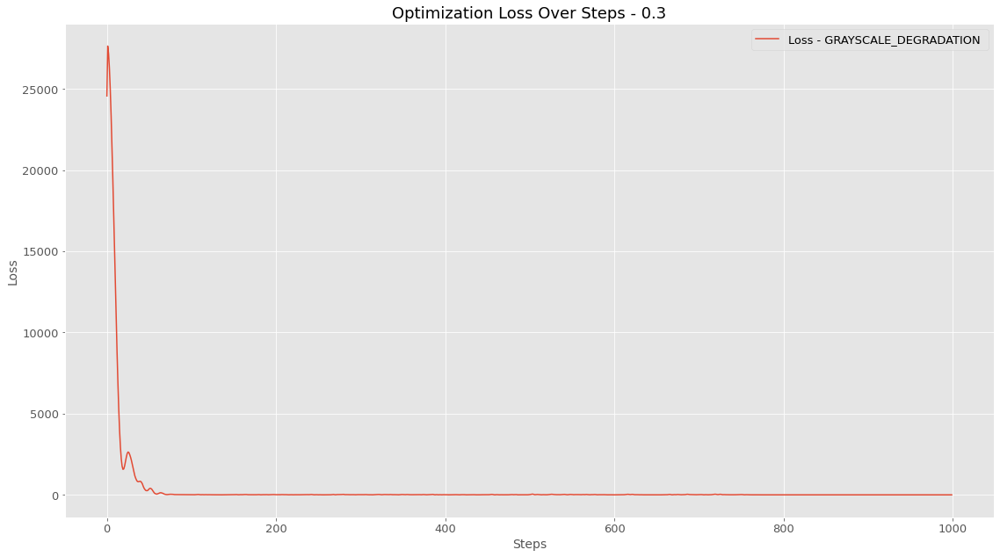

In [ ]:
loss_record = []
invert_image(GRAYSCALE_DEGRADATION,
             colorize_target_fname,
             colorize_outdir+'3/',
            loss_record,
                   num_steps=1000,
                   latent_dist_reg_weight=0.3
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

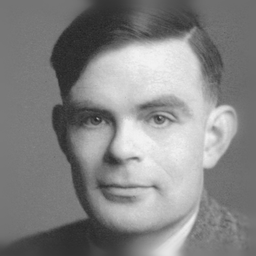
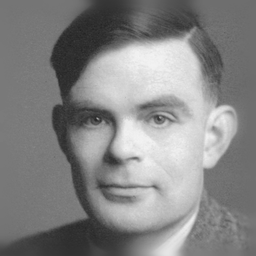
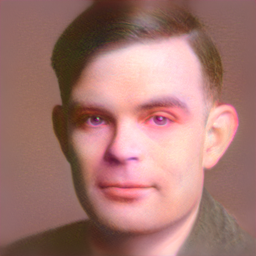
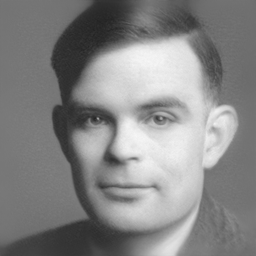

step  981/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  982/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  983/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  984/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  985/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  986/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  987/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  988/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  989/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  990/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  991/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  992/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  993/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  994/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  995/1000: percep_loss 0.10 latent_dist_reg 0.91 loss 0.11 
step  996/1000: percep_lo

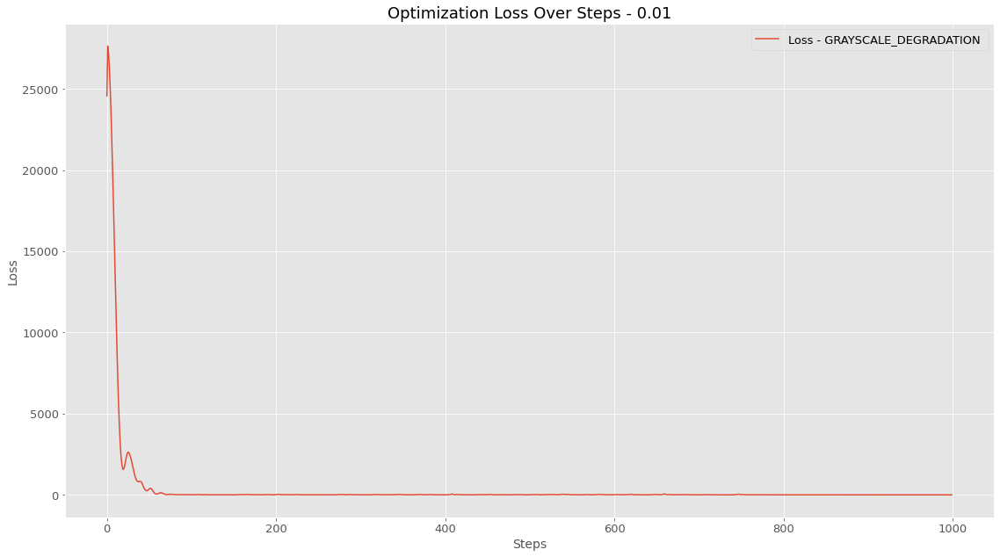

In [ ]:
loss_record = []
invert_image(GRAYSCALE_DEGRADATION,
             colorize_target_fname,
             colorize_outdir+'4/',
            loss_record,
                   num_steps=1000,
                   latent_dist_reg_weight=0.01
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

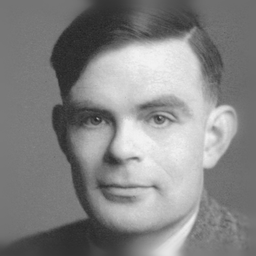
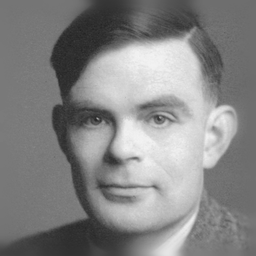
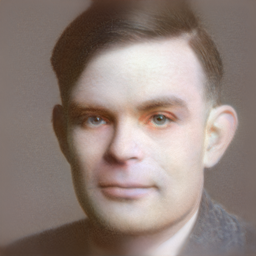
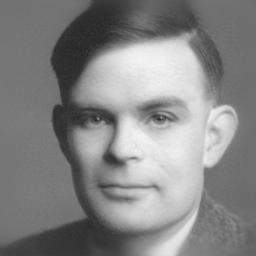

step  681/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  682/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  683/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  684/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  685/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  686/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  687/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  688/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  689/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  690/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  691/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  692/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  693/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  694/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  695/700: percep_loss 0.10 latent_dist_reg 0.28 loss 0.13 
step  696/700: percep_loss 0.10 latent_d

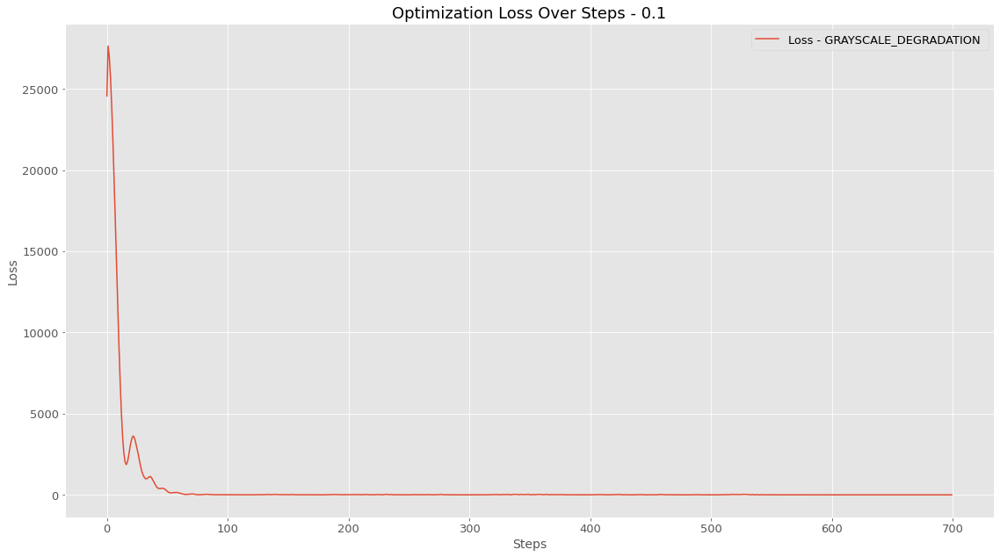

In [ ]:
loss_record = []
invert_image(GRAYSCALE_DEGRADATION,
             colorize_target_fname,
             colorize_outdir+'7/',
            loss_record,
                   num_steps=700,
                   latent_dist_reg_weight=0.1
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

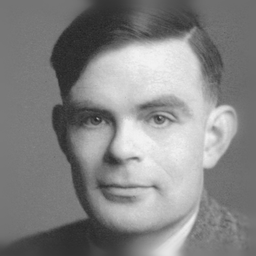
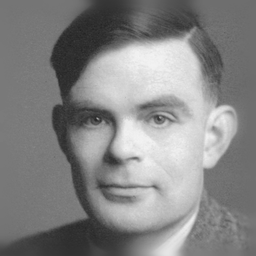
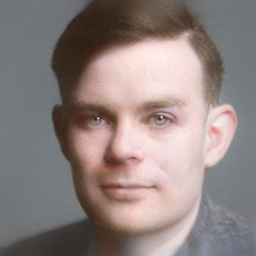
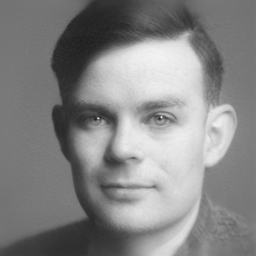

step  981/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  982/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  983/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  984/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  985/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  986/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  987/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  988/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  989/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  990/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  991/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  992/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  993/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  994/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  995/1000: percep_loss 0.14 latent_dist_reg 0.09 loss 0.20 
step  996/1000: percep_lo

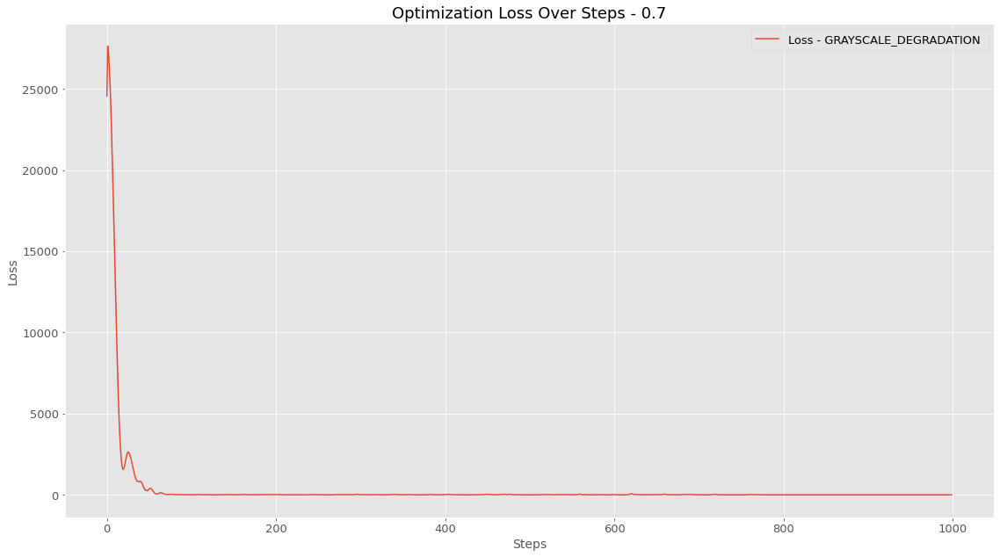

In [ ]:
loss_record = []
invert_image(GRAYSCALE_DEGRADATION,
             colorize_target_fname,
             colorize_outdir+'6/',
            loss_record,
                   num_steps=1000,
                   latent_dist_reg_weight=0.7
             )

### Added to PDF:

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

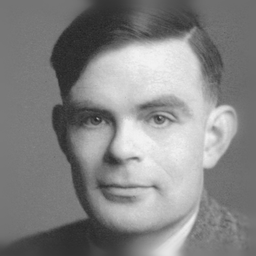
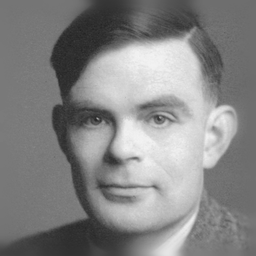
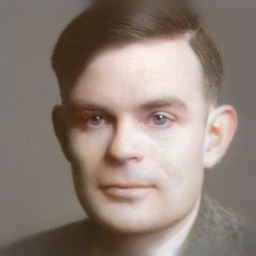
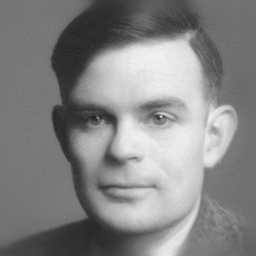

step  981/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  982/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  983/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  984/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  985/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  986/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  987/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  988/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  989/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  990/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  991/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  992/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  993/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  994/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  995/1000: percep_loss 0.11 latent_dist_reg 0.14 loss 0.15 
step  996/1000: percep_lo

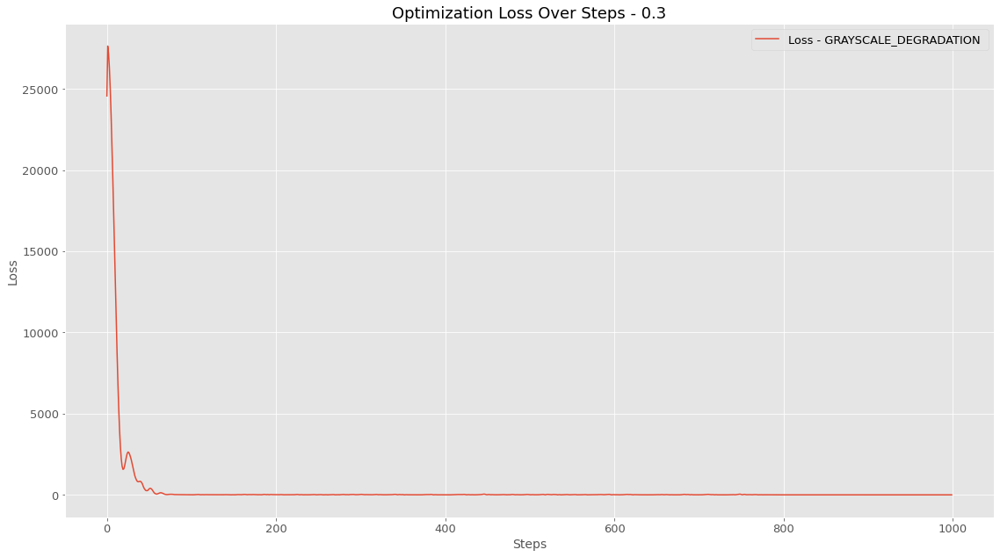

In [ ]:
loss_record = []
invert_image(GRAYSCALE_DEGRADATION,
             colorize_target_fname,
             colorize_outdir+'5/',
            loss_record,
                   num_steps=1000,
                   latent_dist_reg_weight=0.3
             )

### My Pic:

In [ ]:
# Colorize setup:
colorize_task_dir = FULL_GDRIVE_SAVE_PATH + "/colorize_task/"
colorize_original_image_path = colorize_task_dir + "my_img1.png"
colorize_target_fname = colorize_task_dir + 'img1_out.png'
colorize_outdir = colorize_task_dir + "my_out/"

align_any_image(
    colorize_original_image_path,
    colorize_target_fname
)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

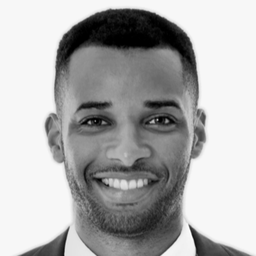
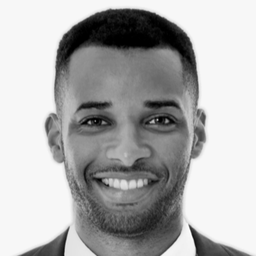
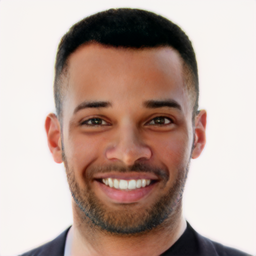
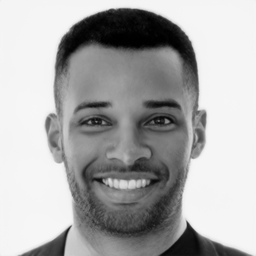

step  981/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  982/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  983/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  984/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  985/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  986/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  987/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  988/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  989/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  990/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  991/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  992/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  993/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  994/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  995/1000: percep_loss 0.06 latent_dist_reg 0.12 loss 0.09 
step  996/1000: percep_lo

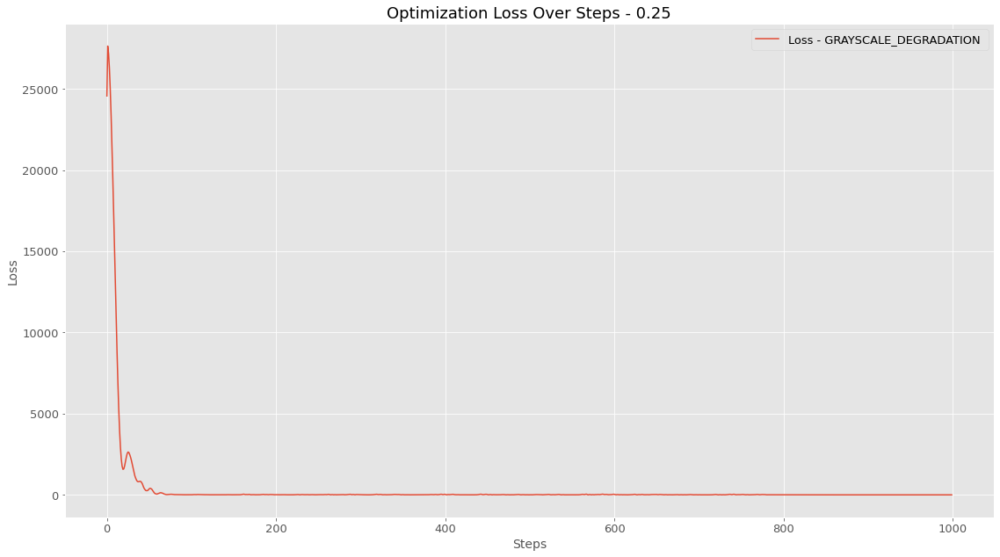

In [ ]:
loss_record = []
invert_image(GRAYSCALE_DEGRADATION,
             colorize_target_fname,
             colorize_outdir,
            loss_record,
                   num_steps=1000,
                   latent_dist_reg_weight=0.25
             )

## 3.1.3 Show Inpainting!

### Setup variables and helpers:


In [ ]:
# Inpaint setup:
inpaint_task_dir = FULL_GDRIVE_SAVE_PATH + "/inpaint_task/"
inpaint_mask_target_fname = inpaint_task_dir + 'img1_mask.png'
inpaint_original_image_path = inpaint_task_dir + "img1.png"
inpaint_target_fname = inpaint_task_dir + 'img1_out.png'
inpaint_outdir = inpaint_task_dir + "out/"

align_any_image(
    inpaint_original_image_path,
    inpaint_target_fname
)

def setup_mask(mask_fname, device, G):
  mask_target_pil = PIL.Image.open(mask_fname).convert('RGB')
  mask_w, mask_h = mask_target_pil.size
  mask_s = min(mask_w, mask_h)
  mask_target_pil = mask_target_pil.crop(((mask_w - mask_s) // 2, (mask_h - mask_s) // 2, (mask_w + mask_s) // 2, (mask_h + mask_s) // 2))
  mask_target_pil = mask_target_pil.resize((G.img_resolution, G.img_resolution), PIL.Image.LANCZOS)
  mask_target_uint8 = np.array(mask_target_pil, dtype=np.uint8)
  mask_target= torch.tensor(mask_target_uint8.transpose([2, 0, 1]), device=device), 
  mask_target = mask_target[0].unsqueeze(0).to(device).to(torch.float32)
  mask_target = mask_target / mask_target.max()
  return mask_target

### Parameters Exploration:

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

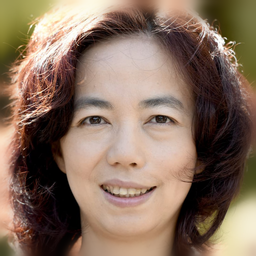
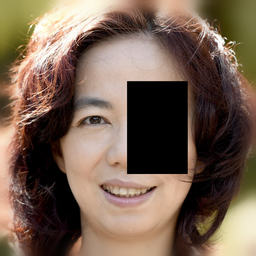
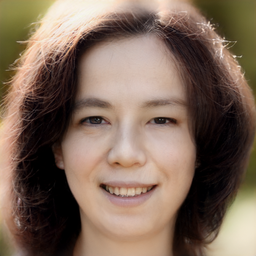
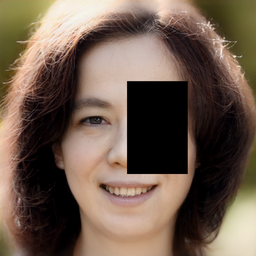

step  281/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.25 
step  282/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.25 
step  283/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  284/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  285/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  286/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  287/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  288/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  289/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  290/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  291/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  292/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  293/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  294/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  295/300: percep_loss 0.18 latent_dist_reg 0.12 loss 0.24 
step  296/300: percep_loss 0.18 latent_d

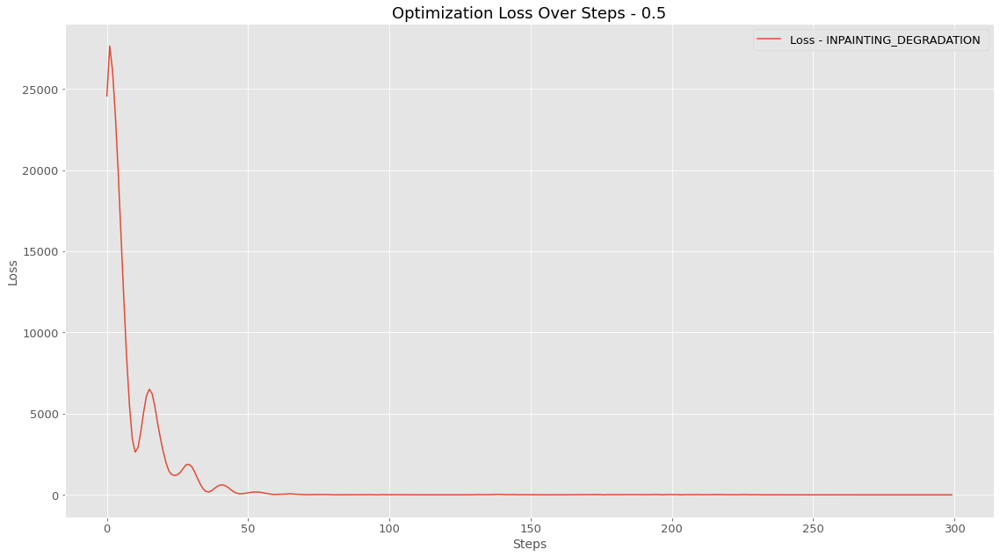

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir,
            loss_record,
            num_steps=300,
            latent_dist_reg_weight=0.5,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

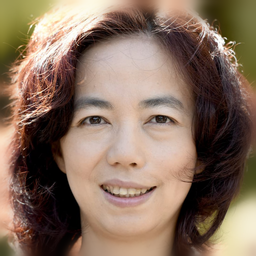
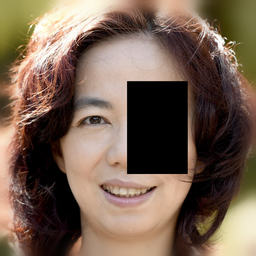
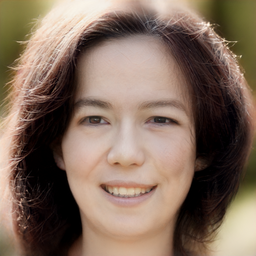
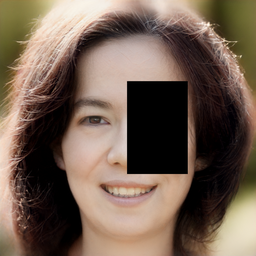

step  681/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  682/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  683/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  684/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  685/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  686/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  687/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  688/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  689/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  690/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  691/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  692/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  693/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  694/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  695/700: percep_loss 0.16 latent_dist_reg 0.12 loss 0.22 
step  696/700: percep_loss 0.16 latent_d

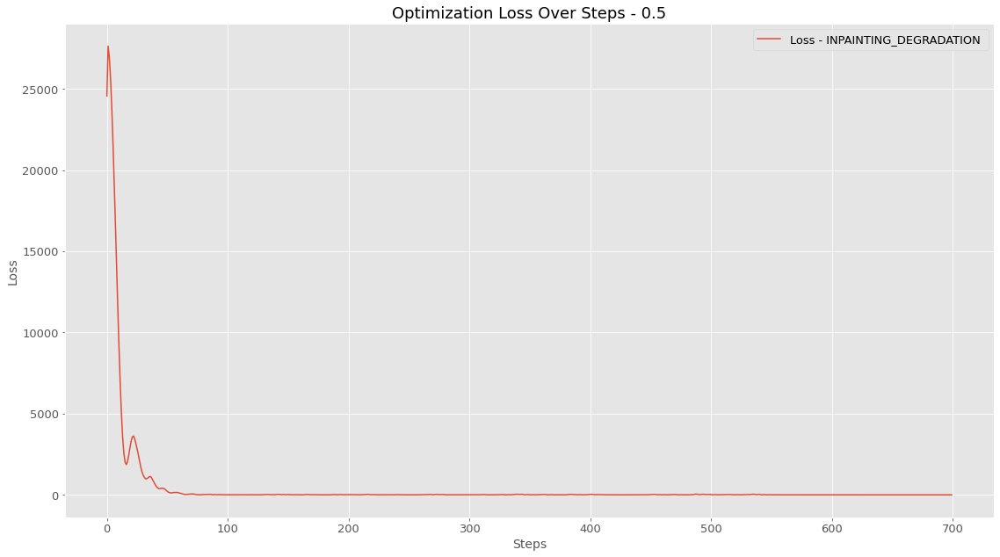

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'1/',
            loss_record,
            num_steps=700,
            latent_dist_reg_weight=0.5,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

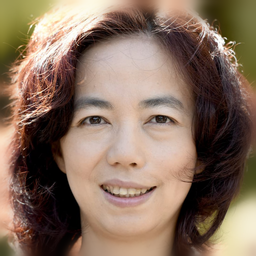
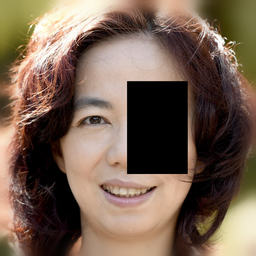
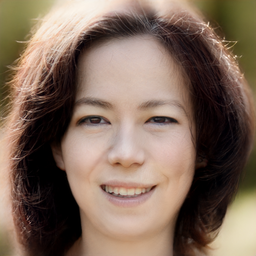
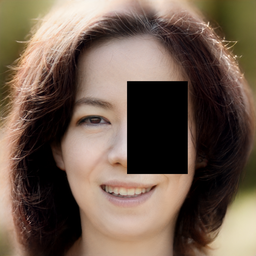

step  981/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  982/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  983/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  984/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  985/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  986/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  987/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  988/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  989/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  990/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  991/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  992/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  993/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  994/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  995/1000: percep_loss 0.16 latent_dist_reg 0.11 loss 0.22 
step  996/1000: percep_lo

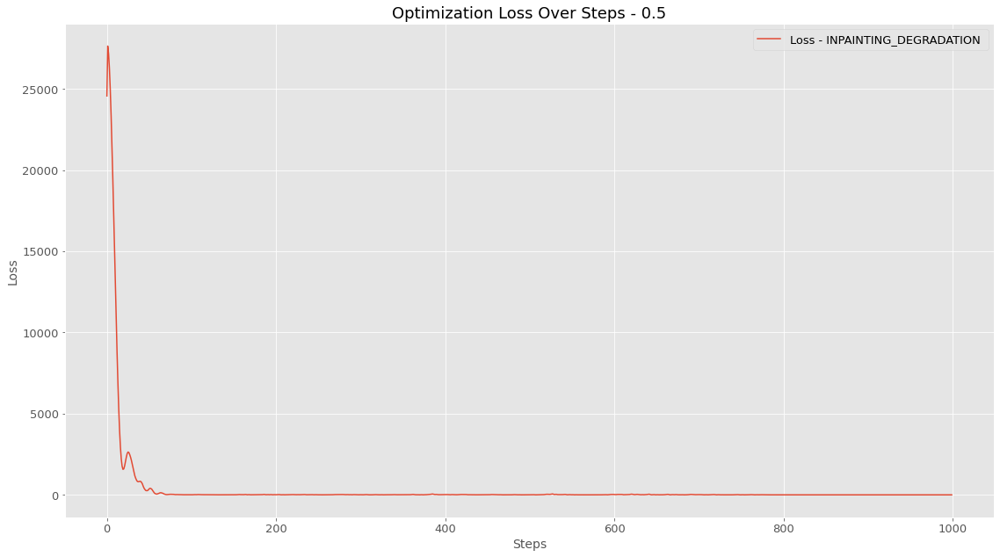

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'2/',
            loss_record,
            num_steps=1000,
            latent_dist_reg_weight=0.5,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

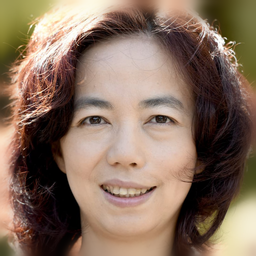
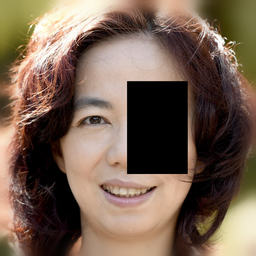
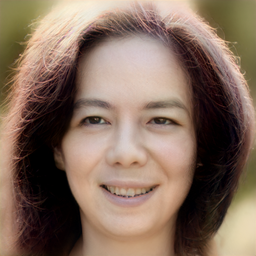
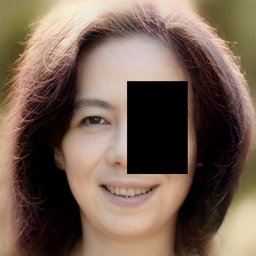

step  281/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.19 
step  282/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.20 
step  283/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.21 
step  284/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.20 
step  285/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.19 
step  286/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.19 
step  287/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.19 
step  288/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.20 
step  289/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.20 
step  290/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.19 
step  291/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.19 
step  292/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.19 
step  293/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.19 
step  294/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.19 
step  295/300: percep_loss 0.18 latent_dist_reg 0.69 loss 0.19 
step  296/300: percep_loss 0.18 latent_d

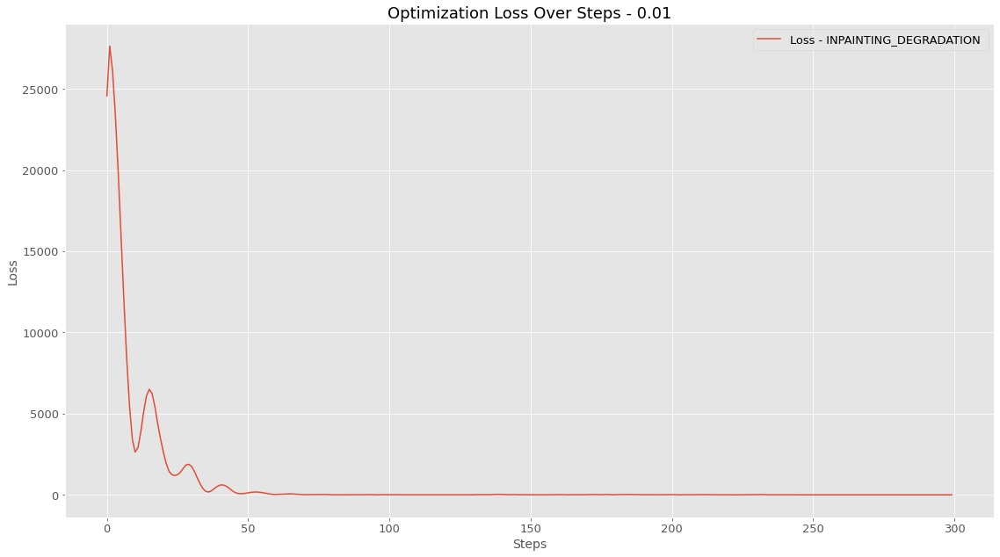

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'3/',
            loss_record,
            num_steps=300,
            latent_dist_reg_weight=0.01,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

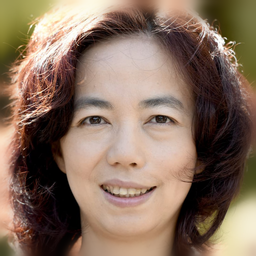
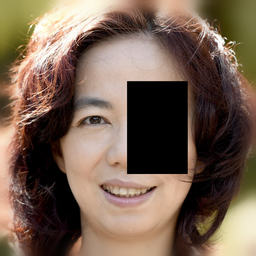
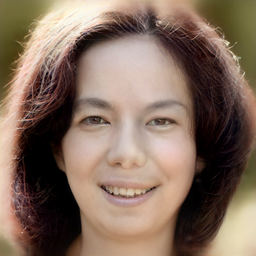
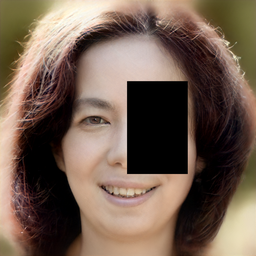

step  681/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  682/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  683/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  684/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  685/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  686/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  687/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  688/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  689/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  690/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  691/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  692/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  693/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  694/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  695/700: percep_loss 0.15 latent_dist_reg 0.86 loss 0.16 
step  696/700: percep_loss 0.15 latent_d

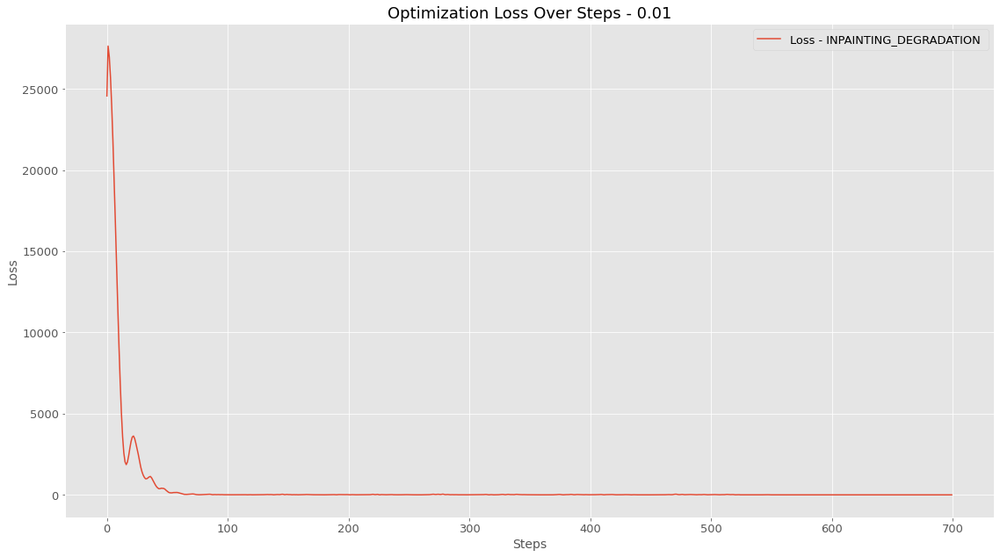

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'4/',
            loss_record,
            num_steps=700,
            latent_dist_reg_weight=0.01,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

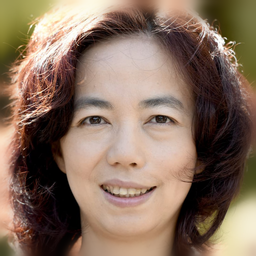
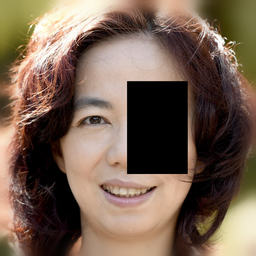
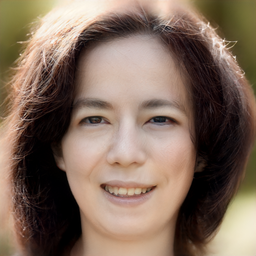
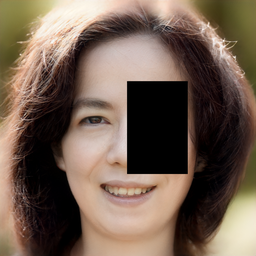

step  981/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  982/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  983/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  984/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  985/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  986/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  987/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  988/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  989/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  990/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  991/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  992/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  993/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  994/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  995/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  996/1000: percep_lo

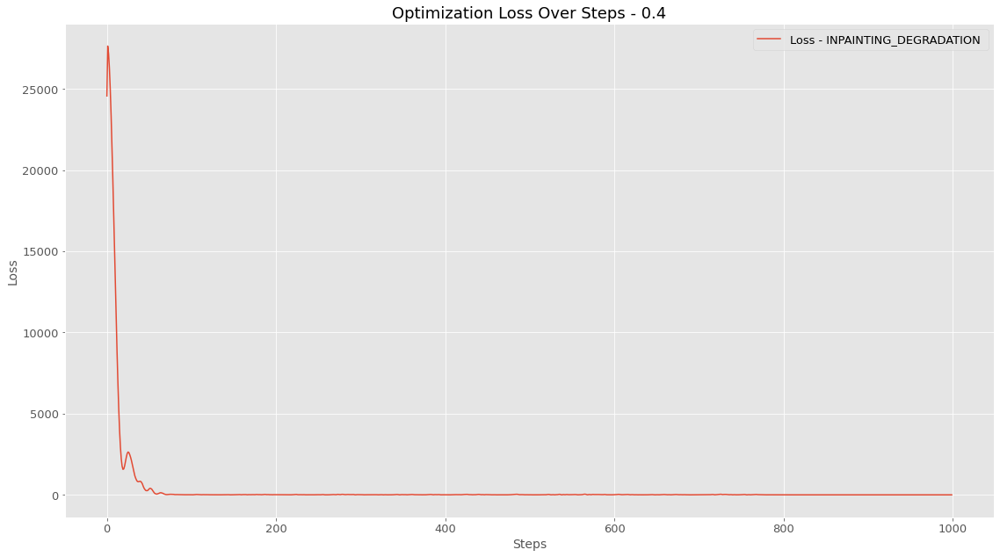

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'6/',
            loss_record,
            num_steps=1000,
            latent_dist_reg_weight=0.4,
            mask= inpaint_mask_target_fname,
             )

### Added to PDF:

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

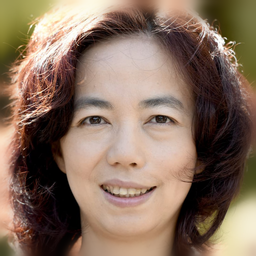
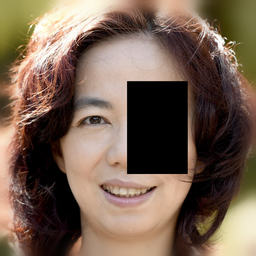
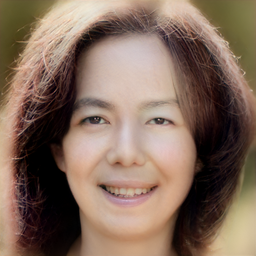
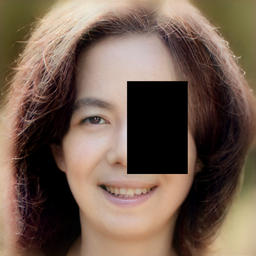

step  401/700: percep_loss 0.19 latent_dist_reg 0.77 loss 5.06 
step  402/700: percep_loss 0.19 latent_dist_reg 0.77 loss 3.85 
step  403/700: percep_loss 0.19 latent_dist_reg 0.77 loss 1.20 
step  404/700: percep_loss 0.19 latent_dist_reg 0.77 loss 1.70 
step  405/700: percep_loss 0.19 latent_dist_reg 0.77 loss 3.15 
step  406/700: percep_loss 0.19 latent_dist_reg 0.77 loss 2.24 
step  407/700: percep_loss 0.19 latent_dist_reg 0.77 loss 1.18 
step  408/700: percep_loss 0.19 latent_dist_reg 0.77 loss 1.77 
step  409/700: percep_loss 0.19 latent_dist_reg 0.77 loss 1.84 
step  410/700: percep_loss 0.19 latent_dist_reg 0.77 loss 0.94 
step  411/700: percep_loss 0.19 latent_dist_reg 0.77 loss 1.08 
step  412/700: percep_loss 0.19 latent_dist_reg 0.77 loss 1.77 
step  413/700: percep_loss 0.19 latent_dist_reg 0.77 loss 1.26 
step  414/700: percep_loss 0.19 latent_dist_reg 0.77 loss 0.62 
step  415/700: percep_loss 0.19 latent_dist_reg 0.77 loss 1.18 
step  416/700: percep_loss 0.19 latent_d

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'5/',
            loss_record,
            num_steps=700,
            latent_dist_reg_weight=0.025,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

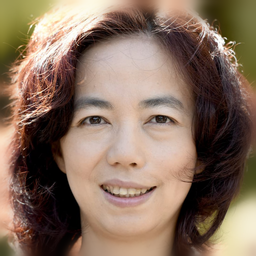
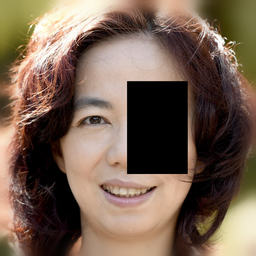
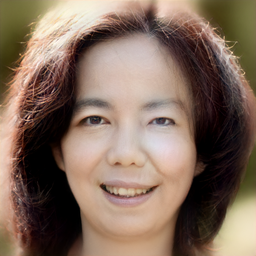
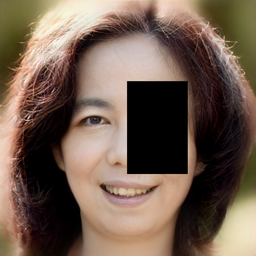

step  981/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  982/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  983/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  984/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  985/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  986/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  987/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  988/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  989/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  990/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  991/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  992/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  993/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  994/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  995/1000: percep_loss 0.13 latent_dist_reg 0.97 loss 0.14 
step  996/1000: percep_lo

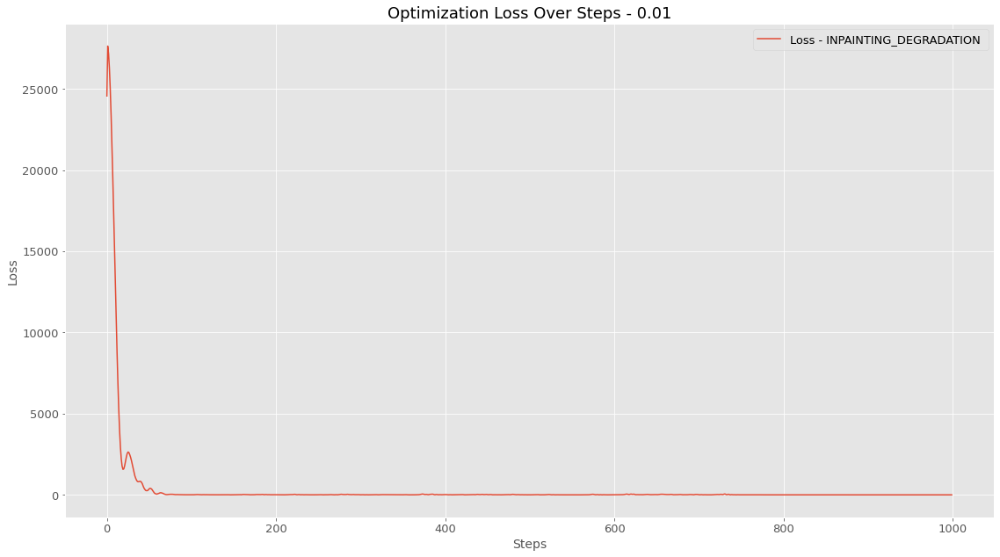

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'5/',
            loss_record,
            num_steps=1000,
            latent_dist_reg_weight=0.01,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

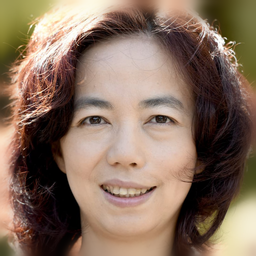
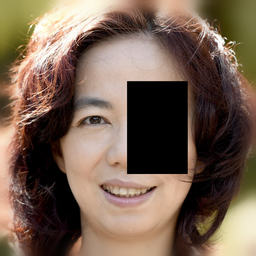
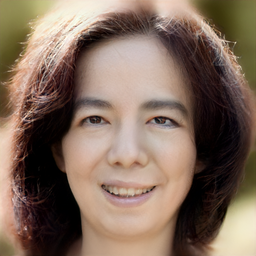
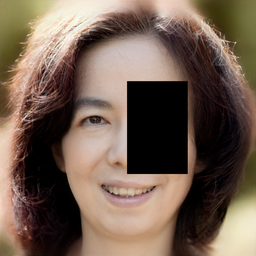

step  981/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  982/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  983/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  984/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  985/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  986/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  987/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  988/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  989/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  990/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  991/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  992/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  993/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  994/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  995/1000: percep_loss 0.12 latent_dist_reg 0.48 loss 0.15 
step  996/1000: percep_lo

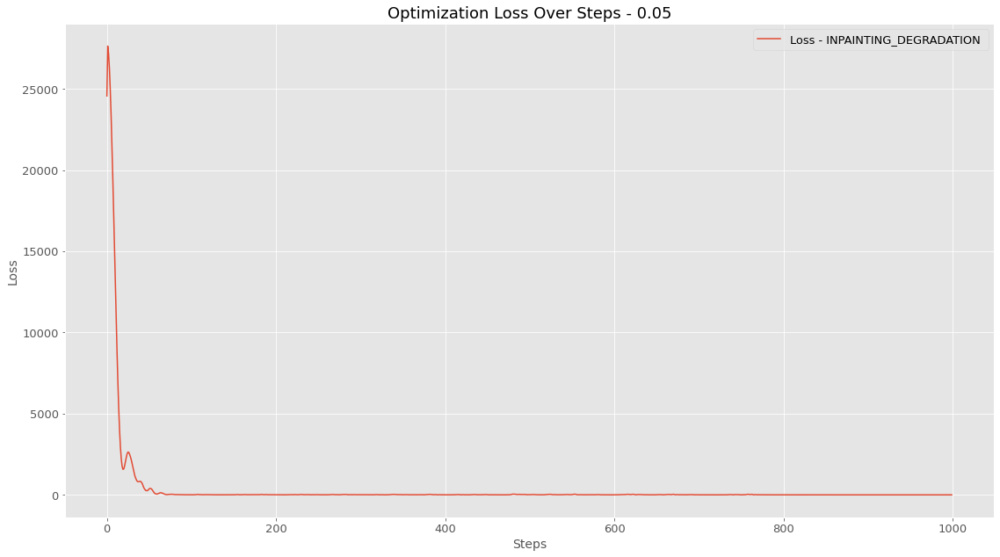

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'5/',
            loss_record,
            num_steps=1000,
            latent_dist_reg_weight=0.05,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

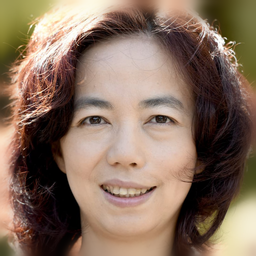
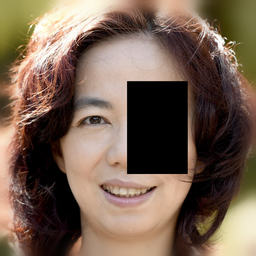
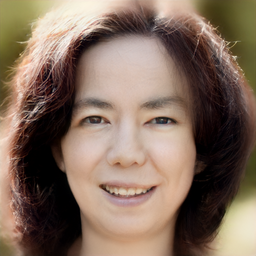
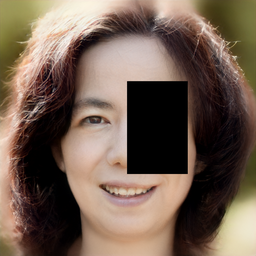

step  981/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  982/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  983/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  984/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  985/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  986/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  987/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  988/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  989/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  990/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  991/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  992/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  993/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  994/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  995/1000: percep_loss 0.13 latent_dist_reg 0.31 loss 0.16 
step  996/1000: percep_lo

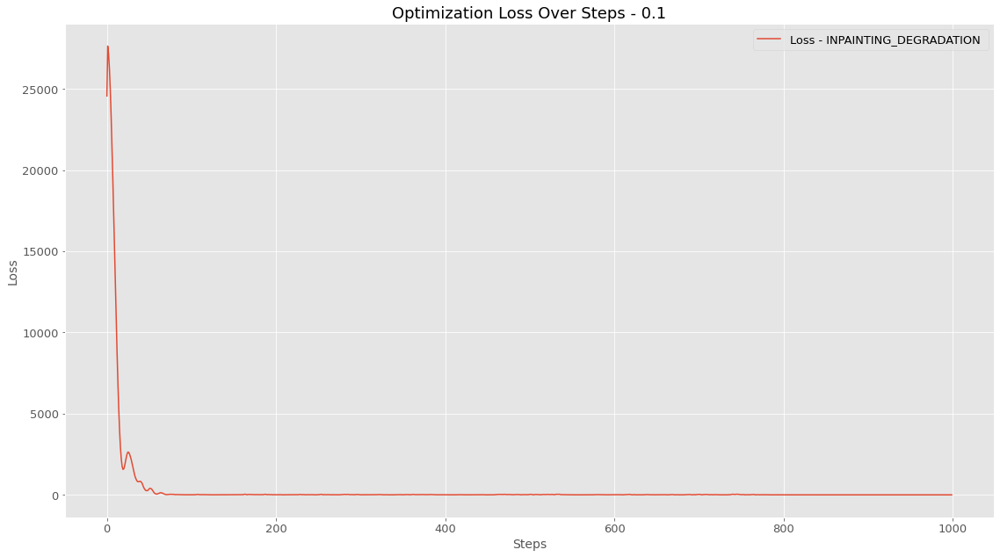

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'5/',
            loss_record,
            num_steps=1000,
            latent_dist_reg_weight=0.1,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

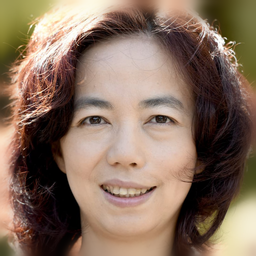
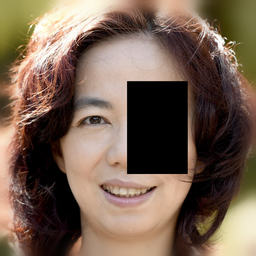
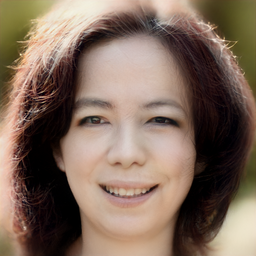
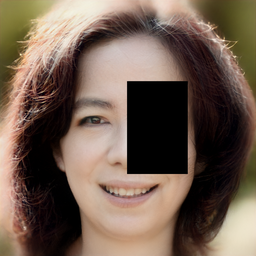

step  981/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  982/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  983/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  984/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  985/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  986/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  987/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  988/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  989/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  990/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  991/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  992/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  993/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  994/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  995/1000: percep_loss 0.14 latent_dist_reg 0.18 loss 0.18 
step  996/1000: percep_lo

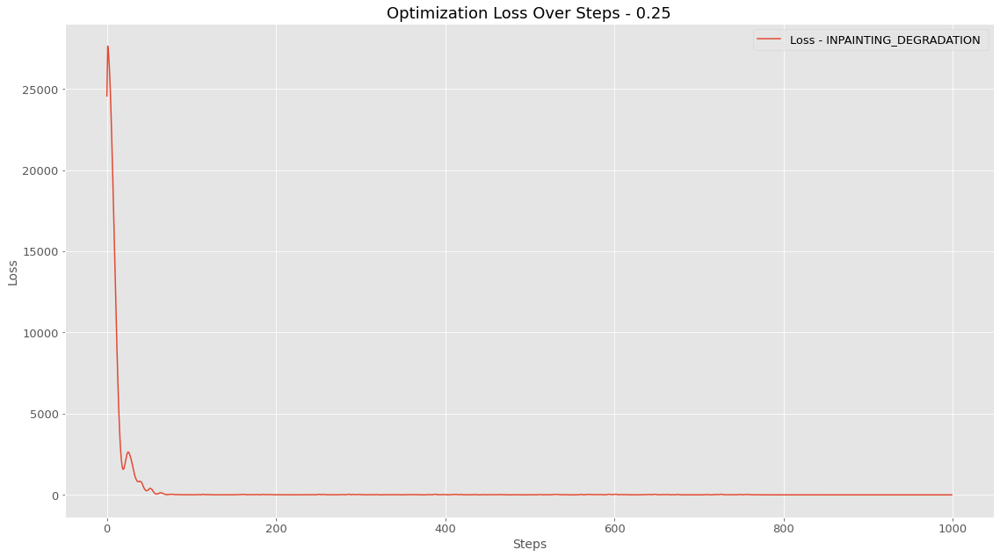

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'5/',
            loss_record,
            num_steps=1000,
            latent_dist_reg_weight=0.25,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

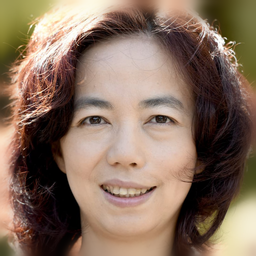
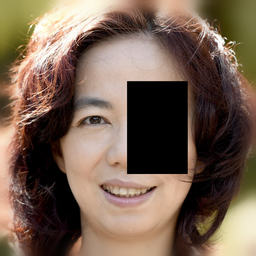
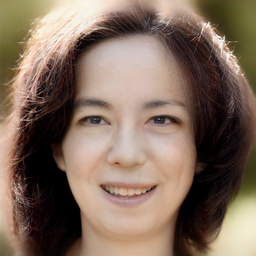
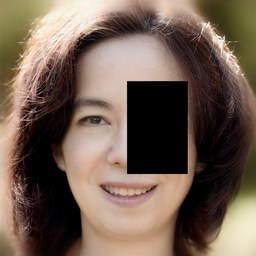

step  981/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  982/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  983/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  984/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  985/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  986/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  987/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  988/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  989/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  990/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  991/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  992/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  993/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  994/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  995/1000: percep_loss 0.14 latent_dist_reg 0.16 loss 0.19 
step  996/1000: percep_lo

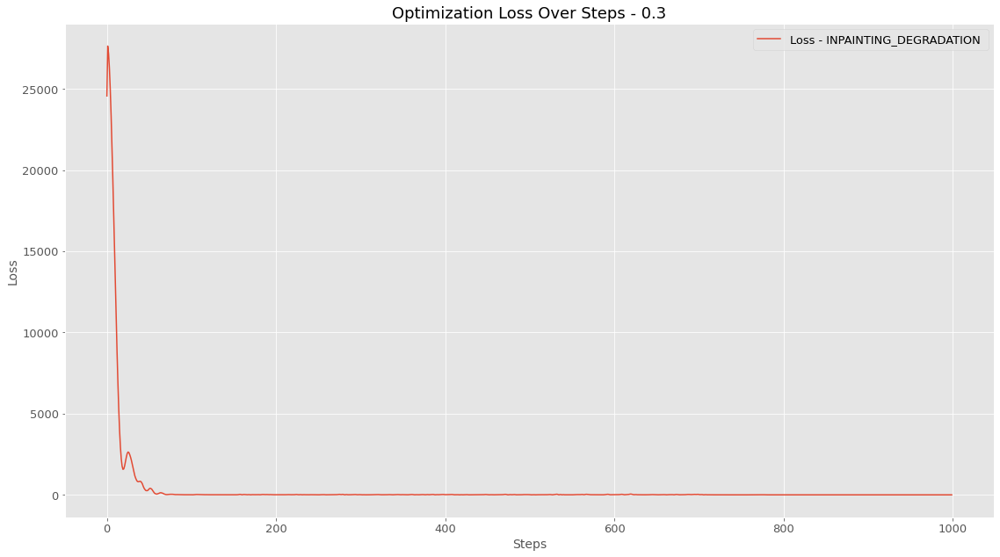

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'5/',
            loss_record,
            num_steps=1000,
            latent_dist_reg_weight=0.3,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

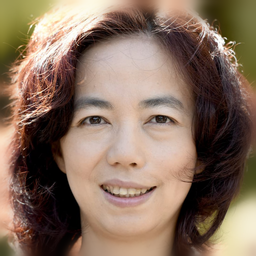
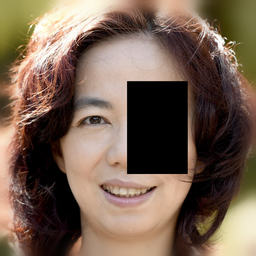
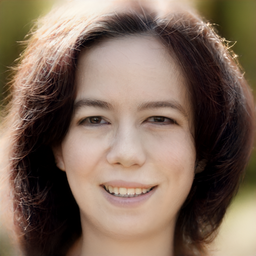
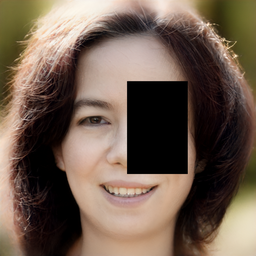

step  981/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  982/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  983/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  984/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  985/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  986/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  987/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  988/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  989/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  990/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  991/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  992/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  993/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  994/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  995/1000: percep_loss 0.15 latent_dist_reg 0.13 loss 0.20 
step  996/1000: percep_lo

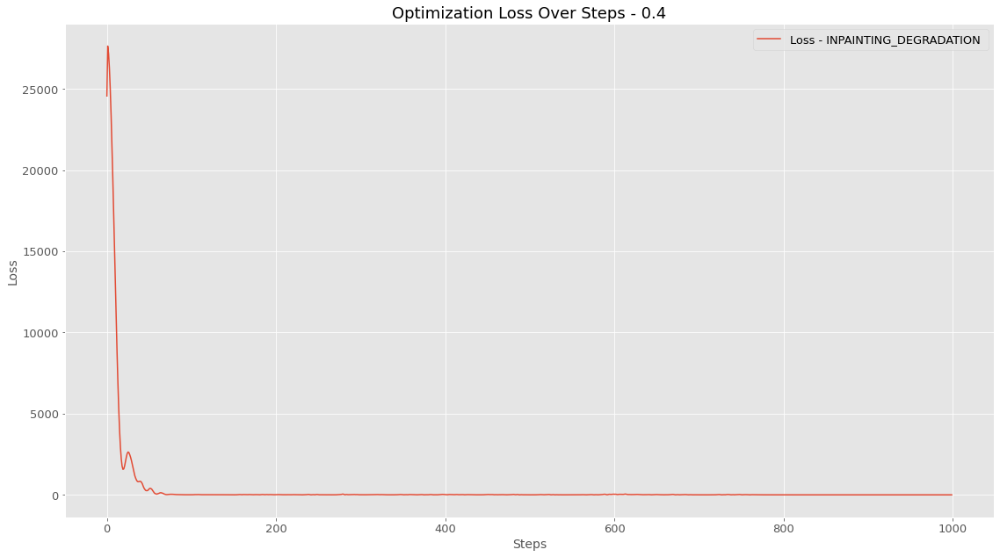

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'5/',
            loss_record,
            num_steps=1000,
            latent_dist_reg_weight=0.4,
            mask= inpaint_mask_target_fname,
             )

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

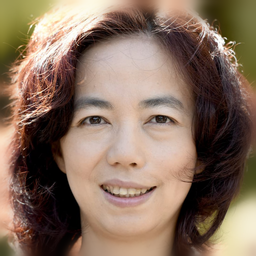
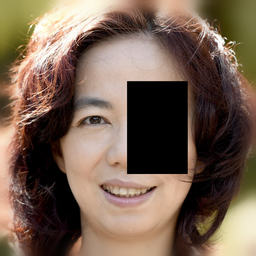
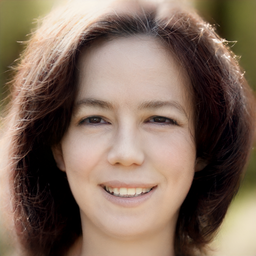
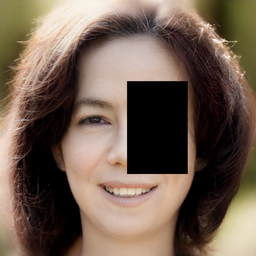

step  981/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  982/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  983/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  984/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  985/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  986/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  987/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  988/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  989/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  990/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  991/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  992/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  993/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  994/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  995/1000: percep_loss 0.15 latent_dist_reg 0.12 loss 0.21 
step  996/1000: percep_lo

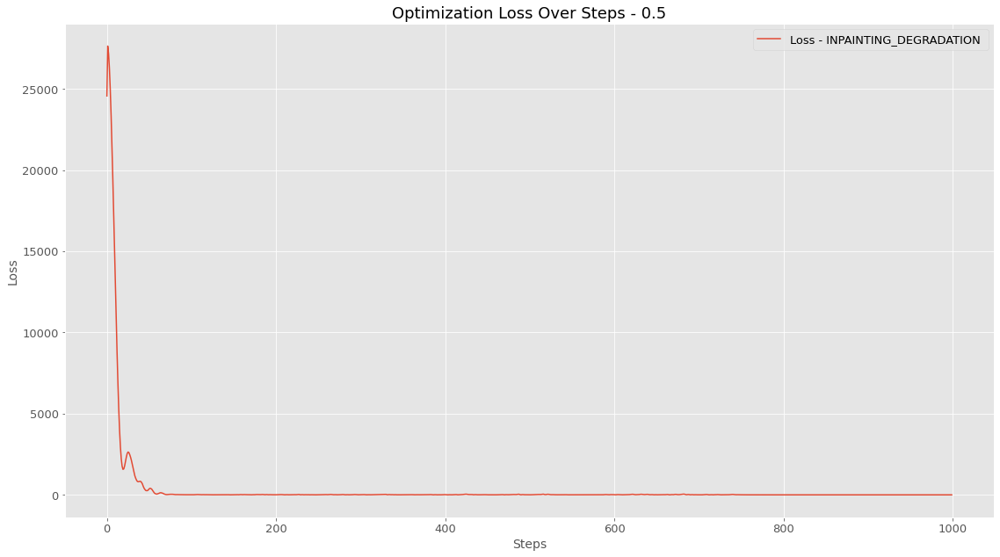

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'5/',
            loss_record,
            num_steps=1000,
            latent_dist_reg_weight=0.3,
            mask= inpaint_mask_target_fname,
             )

### My Pic:

In [ ]:
# Inpaint setup:
inpaint_task_dir = FULL_GDRIVE_SAVE_PATH + "/inpaint_task/"
inpaint_mask_target_fname = inpaint_task_dir + 'img1_mask.png'
inpaint_original_image_path = inpaint_task_dir + "my_img1.png"
inpaint_target_fname = inpaint_task_dir + 'img1_out.png'
inpaint_outdir = inpaint_task_dir + "my_out/"

align_any_image(
    inpaint_original_image_path,
    inpaint_target_fname
)

Original Image,Original Degraded Image,Generated Image,Generated Degraded Image

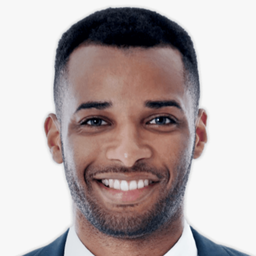
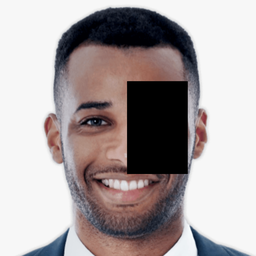
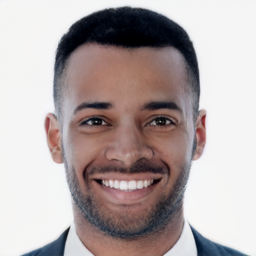
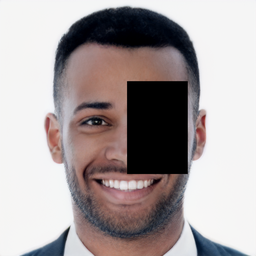

step  981/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  982/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  983/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  984/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  985/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  986/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  987/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  988/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  989/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  990/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  991/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  992/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  993/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  994/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  995/1000: percep_loss 0.05 latent_dist_reg 0.08 loss 0.09 
step  996/1000: percep_lo

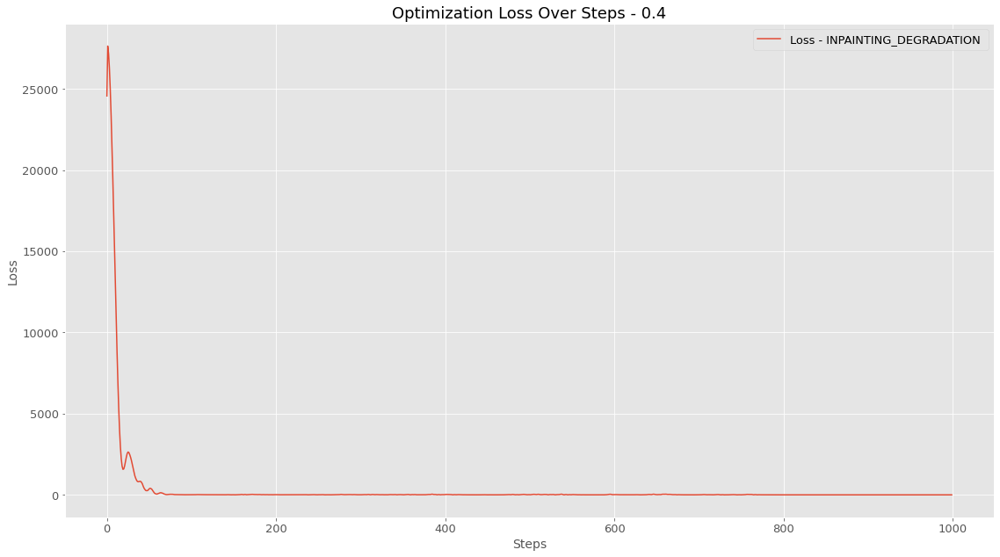

In [ ]:
loss_record = []
invert_image(INPAINTING_DEGRADATION,
             inpaint_target_fname,
             inpaint_outdir+'6/',
            loss_record,
            num_steps=1000,
            latent_dist_reg_weight=0.4,
            mask= inpaint_mask_target_fname,
             )